In [ ]:
import os
import pandas as pd
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
from tqdm import tqdm
import multiprocessing as mp
from scipy.ndimage import convolve
from scipy.signal import fftconvolve
import math
import numpy as np
import numpy.ma as ma
from scipy.ndimage import convolve

# Global constants
R_ARENA_SIZE = 2 * 1.231  # Arena size
R_DT = 0.1                # Time step

def read_best_fsms(file_path='best_fsms.csv'):
    """Reads the best FSMs from a CSV file."""
    if not os.path.exists(file_path):
        print(f"Error: File {file_path} does not exist.")
        return None
    return pd.read_csv(file_path, index_col=0)

def find_fsm_number(fsm, autocontrollers_path):
    """Finds the FSM number in the autocontrollers file."""
    with open(autocontrollers_path, 'r') as f:
        for i, line in enumerate(f):
            if fsm in line:
                return i
    return None

def read_performance_data(mission, fsm_number):
    """Reads performance data for a given mission and FSM number."""
    base_path = f'argoslogs_chocosim/{mission}/Chocolate/simulation/{fsm_number}'
    all_data = []
    
    for filename in os.listdir(base_path):
        if filename.endswith('.csv'):
            with open(os.path.join(base_path, filename), 'r') as f:
                lines = f.readlines()
                
                # Extract positions
                positions_end = next((i for i, line in enumerate(lines) if line.strip() == "# SDBC"), len(lines))
                positions = []
                for line in lines[1:positions_end]:
                    try:
                        pos = [float(x) for x in line.strip().split(',') if x]
                        if pos:
                            positions.append(pos)
                    except ValueError:
                        continue
                
                # Extract objective function
                try:
                    objective_function = float(lines[-1].strip())
                except ValueError:
                    print(f"Warning: Invalid objective function in file {filename}")
                    continue
                
                if positions and objective_function is not None:
                    positions = np.array(positions)
                    x = positions[:, ::2]
                    y = positions[:, 1::2]
                    vx = (x[:, 1:] - x[:, :-1]) / R_DT
                    vy = (y[:, 1:] - y[:, :-1]) / R_DT
                    
                    all_data.append({
                        'x': x, 'y': y, 'vx': vx, 'vy': vy,
                        'objective_function': objective_function,
                        'num_robots': len(positions)
                    })
    
    if not all_data:
        print(f"Warning: No valid data found for mission {mission}, FSM number {fsm_number}")
        return None, None, None
    
    avg_objective_function = np.mean([data['objective_function'] for data in all_data])
    avg_num_robots = np.mean([data['num_robots'] for data in all_data])
    
    return avg_objective_function, avg_num_robots, all_data

def compute_vector_field(run_data, w):
    """
    Computes the mesoscopic vector field U for a single run.
    U_i = (1/M_i) ∑_{k=1}^K ∑_{n=1}^{m_i^k} u_n^k for i ∈ Ω,
    where u_n^k = (x_n^{k+1} - x_n^k)/Δt
    """
    # Transform coordinates to image space
    x_image = -run_data['y'] + R_ARENA_SIZE / 2
    y_image = -run_data['x'] + R_ARENA_SIZE / 2
    vx_image = -run_data['vy']  # Inverted velocities
    vy_image = -run_data['vx']
    
    # Compute grid dimensions
    nx_bins = int(2 * np.ceil(0.5 * R_ARENA_SIZE / w))
    ny_bins = nx_bins
    
    # Create grid edges ensuring coverage of arena
    x_diff = nx_bins * w - R_ARENA_SIZE
    y_diff = ny_bins * w - R_ARENA_SIZE
    x_bins = np.linspace(-x_diff / 2, R_ARENA_SIZE + x_diff / 2, nx_bins + 1)
    y_bins = np.linspace(-y_diff / 2, R_ARENA_SIZE + y_diff / 2, ny_bins + 1)
    
    # Discretize positions
    xd = np.digitize(x_image, x_bins) - 1
    yd = np.digitize(y_image, y_bins) - 1
    
    # Initialize occupancy counter M and velocity accumulator V_sum
    M = np.zeros((ny_bins, nx_bins), dtype=np.int32)
    V_sum = np.zeros((ny_bins, nx_bins, 2), dtype=np.float64)
    
    # Compute M and accumulate velocities
    for t in range(vx_image.shape[1]):
        valid = (yd[:, t] >= 0) & (yd[:, t] < ny_bins) & \
                (xd[:, t] >= 0) & (xd[:, t] < nx_bins)
        if np.any(valid):
            y_idx = yd[valid, t]
            x_idx = xd[valid, t]
            np.add.at(M, (y_idx, x_idx), 1)
            np.add.at(V_sum, (y_idx, x_idx, 0), vx_image[valid, t])
            np.add.at(V_sum, (y_idx, x_idx, 1), vy_image[valid, t])
    
    # Compute U_i = (1/M_i) * V_sum for occupied cells
    mask = M > 0
    U = np.zeros((ny_bins, nx_bins, 2), dtype=np.float64)
    with np.errstate(divide='ignore', invalid='ignore'):
        U[mask, 0] = V_sum[mask, 0] / M[mask]
        U[mask, 1] = V_sum[mask, 1] / M[mask]
    
    # Mask unoccupied cells
    U = ma.masked_array(U, mask=np.broadcast_to(~mask[..., None], U.shape))
    return U, mask

def compute_roughness(U, w):
    """
    Computes the roughness R(U) = R(U_x) + R(U_y),
    where R(U_α) = ∫_Ω ||H U_α||_F^2 dx for α ∈ {x, y}
    """
    def hessian(f):
        # Compute second derivatives with correct axes
        f_xx = np.gradient(np.gradient(f, w, axis=1, edge_order=2), w, axis=1, edge_order=2)
        f_yy = np.gradient(np.gradient(f, w, axis=0, edge_order=2), w, axis=0, edge_order=2)
        f_xy = np.gradient(np.gradient(f, w, axis=1, edge_order=2), w, axis=0, edge_order=2)
        f_yx = np.gradient(np.gradient(f, w, axis=0, edge_order=2), w, axis=1, edge_order=2)
        # Average mixed derivatives for symmetry
        f_xy_avg = (f_xy + f_yx) / 2.0
        return np.array([[f_xx, f_xy_avg],
                         [f_xy_avg, f_yy]])
    
    # Compute Hessian matrices for U_x and U_y
    Hx = hessian(U[:, :, 0])
    Hy = hessian(U[:, :, 1])
    
    # Compute squared Frobenius norms
    norm_Hx_squared = Hx[0, 0, :, :]**2 + 2 * Hx[0, 1, :, :]**2 + Hx[1, 1, :, :]**2
    norm_Hy_squared = Hy[0, 0, :, :]**2 + 2 * Hy[0, 1, :, :]**2 + Hy[1, 1, :, :]**2
    
    # Integrate over Ω using the trapezoidal rule along both axes
    R_Ux = np.trapezoid(np.trapezoid(norm_Hx_squared, dx=w, axis=1), dx=w, axis=0)
    R_Uy = np.trapezoid(np.trapezoid(norm_Hy_squared, dx=w, axis=1), dx=w, axis=0)
    
    return (R_Ux + R_Uy)* w**2 

def compute_connections(mask):
    """
    Computes N_c(U(w)): number of connections between occupied cells
    using 8-neighbourhood connectivity
    """
    kernel = np.array([[1, 1, 1],
                       [1, 0, 1],
                       [1, 1, 1]])
    neighbor_counts = convolve(mask.astype(int), kernel, mode='constant', cval=0)
    total_connections = (neighbor_counts * mask).sum()
    return total_connections // 2  # Each connection is counted twice

def process_single_run(args):
    """
    Process a single run to compute the quality score:
    score = N_c(U(w)) / Adjusted R(U(w))
    """
    run_data, w = args
    U, mask = compute_vector_field(run_data, w)
    R = compute_roughness(U, w)  # R is already adjusted
    N_c = compute_connections(mask)
    
    if R > 1e-8:  # Threshold to avoid division by very small roughness values
        quality_score = N_c / R
    else:
        quality_score = 0
    
    return quality_score, N_c, R

def find_optimal_bin_width(all_mission_data, n_workers=None):
    """Find the optimal bin width using parallel processing with scaling adjustment."""
    if n_workers is None:
        n_workers = min(mp.cpu_count() - 1, 25)
    
    w_range = np.linspace(0.14, 0.24, 15)  # Adjust as needed
    metrics = {}
    
    quality_scores = []
    N_c_values = []
    R_values = []
    
    with mp.Pool(processes=n_workers) as pool:
        for w in tqdm(w_range, desc="Processing bin widths"):
            # Prepare all run data for this w
            run_params = [(run_data, w) for mission_data in all_mission_data 
                          for run_data in mission_data]
            
            # Process all runs for this w in parallel
            results = pool.map(process_single_run, run_params)
            
            # Unpack results
            quality_scores_w, N_c_w, R_w = zip(*results)
            
            # Check if all results have zero quality scores
            if all(score == 0 for score in quality_scores_w):
                print(f"\nAll roughness values below threshold at w = {w:.4f}. Stopping computation.")
                break
            
            metrics[w] = results
            quality_scores.append(np.median(quality_scores_w))
            N_c_values.append(np.median(N_c_w))
            R_values.append(np.median(R_w))
        
    # Use only the w values that were actually computed
    computed_w = list(metrics.keys())
    
    if not computed_w:
        print("No valid results found. All roughness values below threshold.")
        return None, None, None, None, None, None
    
    # Find optimal w based on the adjusted quality scores
    optimal_w = computed_w[np.argmax(quality_scores)]
    
    return optimal_w, computed_w, N_c_values, R_values, quality_scores


In [ ]:
# Load best FSMs
best_fsms = read_best_fsms()
if best_fsms is None:
    exit(1)

# Collect all mission data
all_mission_data = []
for mission, row in best_fsms.iterrows():
    mission_name = mission.split('_')[0]
    best_fsm = row['Best FSM']
    autocontrollers_path = f'Design/{mission_name}/Chocolate/autocontrollers.txt'
    
    fsm_number = find_fsm_number(best_fsm, autocontrollers_path)
    if fsm_number is not None:
        _, _, mission_data = read_performance_data(mission_name, fsm_number)
        if mission_data is not None:
            all_mission_data.append(mission_data)
        else:
            print(f"No valid data found for {mission_name}")
    else:
        print(f"Could not find FSM number for {mission_name}")

In [ ]:
# Find optimal bin width
optimal_w_normalized, computed_w, N_c_values, R_values, quality_scores_normalized = find_optimal_bin_width(all_mission_data)
print(f"Optimal bin width (Normalized): {optimal_w_normalized:.4f} m")

# Display results for each mission
for mission, data in zip(best_fsms.index, all_mission_data):
    avg_performance = np.mean([run['objective_function'] for run in data])
    avg_num_robots = np.mean([run['num_robots'] for run in data])
    print(f"\nMission: {mission}")
    print(f"Average Performance: {avg_performance:.4f}")
    print(f"Average Number of Robots: {avg_num_robots:.2f}")

In [ ]:
# Plot results
plt.figure(figsize=(15, 10))

plt.subplot(311)
plt.plot(computed_w, quality_scores_normalized, label='Normalized')
plt.ylabel('Quality Score')
plt.title('Quality Scores (Normalized) vs Bin Width')
plt.legend()
plt.grid(True)

plt.subplot(312)
plt.plot(computed_w, N_c_values)
plt.ylabel('N_c')
plt.title('Number of Connections vs Bin Width')
plt.grid(True)

plt.subplot(313)
plt.plot(computed_w, R_values)
plt.xlabel('Bin Width (m)')
plt.ylabel('Scaled Roughness')
plt.title('Scaled Roughness vs Bin Width')
plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import os
import pandas as pd
import numpy as np
import numpy.ma as ma
import matplotlib.pyplot as plt
from tqdm import tqdm
from functools import partial
import multiprocessing as mp
from scipy.ndimage import convolve

# Global variables (unchanged)
R_ARENA_SIZE = 2 * 1.231
R_EPUCK_RADIUS = 0.035
R_DT = 0.1 
optimal_w_normalized = 0.2043  # Previously computed optimal bin widths

def read_best_fsms(file_path='best_fsms.csv'):
    return pd.read_csv(file_path, index_col=0)

best_fsms = read_best_fsms()

import joblib

# Define file paths
all_mission_data_path = 'all_mission_data.joblib'
mission_vector_fields_path = 'mission_vector_fields.joblib'

# Load all_mission_data
all_mission_data = joblib.load(all_mission_data_path)
print(f"Loaded all_mission_data from {all_mission_data_path}")


In [ ]:
def generate_vector_field(x, y, vx, vy, w):
    """Generates the vector field U using the correct methodology"""
    # Transform coordinates
    x_image = -y + R_ARENA_SIZE/2
    y_image = -x + R_ARENA_SIZE/2
    vx_image = -vy
    vy_image = -vx
    
    # Compute grid dimensions
    nx_bins = int(2 * np.ceil(0.5 * R_ARENA_SIZE / w))
    ny_bins = nx_bins
    
    # Create grid edges
    x_diff = nx_bins * w - R_ARENA_SIZE
    y_diff = ny_bins * w - R_ARENA_SIZE
    x_bins = np.linspace(-x_diff/2, R_ARENA_SIZE + x_diff/2, nx_bins + 1)
    y_bins = np.linspace(-y_diff/2, R_ARENA_SIZE + y_diff/2, ny_bins + 1)
    
    # Discretize positions
    xd = np.digitize(x_image, x_bins) - 1
    yd = np.digitize(y_image, y_bins) - 1
    
    # Initialize accumulation arrays
    M = np.zeros((ny_bins, nx_bins), dtype=np.int32)
    V_sum = np.zeros((ny_bins, nx_bins, 2), dtype=np.float64)
    
    # Compute M_i and velocity sums
    for t in range(vx_image.shape[1]):
        valid = (yd[:, t] >= 0) & (yd[:, t] < ny_bins) & \
                (xd[:, t] >= 0) & (xd[:, t] < nx_bins)
        
        if np.any(valid):
            y_idx = yd[valid, t].astype(int)
            x_idx = xd[valid, t].astype(int)
            
            np.add.at(M, (y_idx, x_idx), 1)
            np.add.at(V_sum, (y_idx, x_idx, 0), vx_image[valid, t])
            np.add.at(V_sum, (y_idx, x_idx, 1), vy_image[valid, t])
    
    # Compute vector field
    mask = M > 0
    U = np.zeros((ny_bins, nx_bins, 2), dtype=np.float64)
    
    with np.errstate(divide='ignore', invalid='ignore'):
        U[mask, 0] = V_sum[mask, 0] / M[mask]
        U[mask, 1] = V_sum[mask, 1] / M[mask]
    
    U = ma.masked_array(U, mask=np.broadcast_to(~mask[..., None], U.shape))
    return U, mask

def generate_mission_vector_field(mission_data, optimal_w):
    """Generates a vector field for all runs in a mission"""
    all_x = np.concatenate([run['x'] for run in mission_data])
    all_y = np.concatenate([run['y'] for run in mission_data])
    all_vx = np.concatenate([run['vx'] for run in mission_data])
    all_vy = np.concatenate([run['vy'] for run in mission_data])
    
    U, mask = generate_vector_field(all_x, all_y, all_vx, all_vy, optimal_w)
    return U, mask

def visualize_vector_field(mission_name, U, mask, R_ARENA_SIZE):
    """Visualizes the vector field for a given mission."""
    ny_bins, nx_bins = U.shape[:2]
    
    # Create grid
    x_edges = np.linspace(-R_ARENA_SIZE / 2, R_ARENA_SIZE / 2, nx_bins + 1)
    y_edges = np.linspace(-R_ARENA_SIZE / 2, R_ARENA_SIZE / 2, ny_bins + 1)
    x_centers = (x_edges[:-1] + x_edges[1:]) / 2
    y_centers = (y_edges[:-1] + y_edges[1:]) / 2
    X, Y = np.meshgrid(x_centers, y_centers)
    
    # Prepare masked arrays
    Ux = np.ma.masked_array(U[:, :, 0], mask=~mask)
    Uy = np.ma.masked_array(U[:, :, 1], mask=~mask)
    speed = np.sqrt(Ux**2 + Uy**2)
    
    # Create plot
    plt.figure(figsize=(12, 10))
    Q = plt.quiver(X, Y, Ux, Uy, speed, angles='xy', scale_units='xy', scale=1,
                  cmap='viridis', width=0.005, minlength=0)
    
    plt.title(f'Swarm Behavior Vector Field - {mission_name}', fontsize=16)
    plt.xlabel('X position (m)', fontsize=14)
    plt.ylabel('Y position (m)', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlim(-R_ARENA_SIZE / 2, R_ARENA_SIZE / 2)
    plt.ylim(-R_ARENA_SIZE / 2, R_ARENA_SIZE / 2)
    plt.gca().set_aspect('equal', adjustable='box')
    
    # Add colorbar
    cbar = plt.colorbar(Q)
    cbar.set_label('Velocity Magnitude (m/s)', fontsize=14)
    cbar.ax.tick_params(labelsize=12)
    
    # Add reference arrow
    max_speed = speed.max()
    plt.quiverkey(Q, 0.85, 0.95, max_speed, f'{max_speed:.2f} m/s',
                  labelpos='E', coordinates='figure', fontproperties={'size': 14})
    
    plt.tight_layout()
    plt.savefig(f'swarm_field_{mission_name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# For Jupyter notebook usage:
def analyze_missions(best_fsms, all_mission_data, optimal_w_normalized):
    """Analyze all missions and generate vector fields"""
    # Generate vector fields for each mission
    mission_vector_fields = {}
    for mission, data in tqdm(zip(best_fsms.index, all_mission_data), 
                            total=len(best_fsms), 
                            desc="Generating mission vector fields"):
        U, mask = generate_mission_vector_field(data, optimal_w_normalized)
        mission_vector_fields[mission] = (U, mask)
    
    # Display basic information about the vector fields
    for mission, (U, mask) in mission_vector_fields.items():
        print(f"\nMission: {mission}")
        print(f"Vector field shape: {U.shape}")
        print(f"Number of occupied cells: {np.sum(mask)}")
        print(f"Mean velocity magnitude: {np.mean(np.linalg.norm(U, axis=2)[mask]):.4f}")
    
    # Visualize each vector field
    for mission, (U, mask) in mission_vector_fields.items():
        visualize_vector_field(mission, U, mask, R_ARENA_SIZE)
    
    return mission_vector_fields

# First cell: Import and data loading
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm  

# Generate and visualize vector fields
mission_vector_fields = analyze_missions(best_fsms, all_mission_data, optimal_w_normalized)

In [ ]:
#!/usr/bin/env python3

import os
import sys
import warnings
import re
import numpy as np
import numpy.ma as ma
import pandas as pd
import matplotlib.pyplot as plt
import skfda as sf
from skfda.exploratory.stats import fisher_rao_karcher_mean
from skfda.preprocessing.registration import FisherRaoElasticRegistration
from skfda.misc.operators import SRSF
from functools import partial
import multiprocessing as mp
from multiprocessing import Pool
from tqdm import tqdm
from time import time
from scipy.ndimage import convolve
from gudhi import AlphaComplex, SimplexTree
from gudhi.representations import Silhouette
from pynhhd import nHHD

# ----------------------------
# Monkey Patch for Deprecated np.float
# ----------------------------
import pynhhd.poisson
import pynhhd.nHHD

# Replace np.float with float globally within pynhhd.poisson
pynhhd.poisson.np.float = float  # or np.float64

In [ ]:
import numpy as np
import numpy.ma as ma
from scipy.ndimage import label
from gudhi import AlphaComplex

def createSimplexTree(x, mask=None):
    """Encode masked 2D array as simplex tree."""
    # Ensure the input is a masked array
    if mask is not None:
        if not ma.isMaskedArray(x):
            x = ma.masked_where(~mask, x)
        else:
            x = ma.masked_where(~mask, x)
    else:
        if not ma.isMaskedArray(x):
            x = ma.masked_array(x, mask=x == 0)
        else:
            x = ma.masked_where(x == 0, x)
    
    m = x.mask
    if isinstance(m, np.bool_):
        m = np.full(x.shape, m)
    
    r, c = np.nonzero(~m)
    points = []
    filtration_values = []
    
    for ri, ci in zip(r, c):
        points.append([ci, -ri])  # Note the swapping of axes to match the coordinate system
        filtration_values.append(float(x[ri, ci]))
    
    # Define the number of bins based on component shape
    nx_bins, ny_bins = m.shape
    points = np.array(points)
    
    #scaling the points to fit the unit square
    ax = AlphaComplex(points=points)
    st = ax.create_simplex_tree(optimal_w_normalized*5)
    st.reset_filtration(-1e8)
    
    # Assign filtration values to vertices
    for idx, filtration in enumerate(filtration_values):
        st.assign_filtration([idx], filtration)
    st.make_filtration_non_decreasing()
    
    return st

def pd2ndarr(dgm, dim):
    """Extracts PD of dimension dim from dgm into ndarray."""
    x = np.copy(np.atleast_2d(np.asarray([p[1] for p in dgm if p[0] == dim])))
    if x.size == 0:
        x = np.array([[0., 0.]])
    return x

def check_data_validity(field, mask):
    """Check if the data is valid for gradient calculation."""
    if field.shape[:2] != mask.shape:
        raise ValueError(f"Field spatial dimensions {field.shape[:2]} don't match mask shape {mask.shape}")
    
    unmasked_count = np.sum(~mask)
    if unmasked_count < 2:
        raise ValueError(f"Not enough unmasked points ({unmasked_count}). Need at least 2.")
    
    # Check continuous regions
    labeled_regions, num_regions = label(~mask)
    if num_regions == 0:
        raise ValueError("No valid regions found in mask.")
    
    # Vérifier la taille des régions
    small_regions = 0
    for i in range(1, num_regions + 1):
        region_size = np.sum(labeled_regions == i)
        print(f"Region {i} size: {region_size}")
        if region_size < 2:  # Taille minimale pour un gradient
            small_regions += 1
    
    if small_regions > 0:
        print(f"Warning: {small_regions} regions are smaller than minimal size for gradient calculation")
    
    return True

def extendedPersistence(field, dx, mask):
    """Extended persistence for a masked vector field with separation dx."""
    # Debug: Print shapes and mask information
    print(f"Field shape: {field.shape}")
    print(f"Mask shape: {mask.shape}")
    print(f"Number of unmasked values: {np.sum(~mask)}")
    
    # Validate data first
    check_data_validity(field, mask)
    
    # Decompose field into Divergence and Curl
    ny_bins, nx_bins = field.shape[:2]
    nhhd = nHHD(grid=(ny_bins, nx_bins), spacings=dx)
    
    # Create the masked array directly from the field
    masked_field = ma.array(field, mask=~np.dstack((mask, mask)))
    print(f"Masked field shape: {masked_field.shape}")
    print(f"Number of unmasked values in masked field: {np.sum(~masked_field.mask)}")
    
    try:
        nhhd.decompose(masked_field)
    except ValueError as e:
        print("Error during decomposition:")
        print(f"Active (unmasked) region shape in each dimension:")
        active_rows = np.any(~masked_field.mask, axis=1)
        active_cols = np.any(~masked_field.mask, axis=0)
        print(f"Active rows: {np.sum(active_rows)}")
        print(f"Active cols: {np.sum(active_cols)}")
        raise e

def plot_silhouettes(silhouettes, titles=None):
    """Plot a list of silhouettes."""
    num_silhouettes = len(silhouettes)
    fig, axes = plt.subplots(2, (num_silhouettes + 1) // 2, figsize=(15, 6))
    axes = axes.flatten()
    
    for idx, sil in enumerate(silhouettes):
        axes[idx].plot(sil)
        if titles:
            axes[idx].set_title(titles[idx])
        axes[idx].set_xlabel('Normalized Persistence')
        axes[idx].set_ylabel('Silhouette Value')
    
    plt.tight_layout()
    plt.show()

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import cumulative_trapezoid
from typing import Tuple, List, Optional, Dict
import skfda
from skfda import FDataGrid, FDataBasis
from skfda.representation.basis import Fourier
from skfda.preprocessing.registration import FisherRaoElasticRegistration
from skfda.representation.grid import FDataGrid
from gudhi.representations import Silhouette
from skfda.preprocessing.registration import ElasticRegistration  # Import ElasticRegistration


def to_srvf(f: np.ndarray, t: Optional[np.ndarray] = None) -> Tuple[np.ndarray, np.ndarray]:
    """
    Convert function to Square Root Velocity Function (SRVF) representation.
    """
    if t is None:
        t = np.linspace(0, 1, len(f))
    df = np.gradient(f, t)
    # Handle zero derivatives to avoid sqrt(0)
    df[df == 0] = 1e-10
    q = np.sign(df) * np.sqrt(np.abs(df))
    return q, t

def from_srvf(q: np.ndarray, t: np.ndarray, f0: float = 0) -> np.ndarray:
    """
    Convert from SRVF back to original function space.
    """
    df = q * np.abs(q)
    f = f0 + cumulative_trapezoid(df, t, initial=0)
    return f

def elastic_distance(f1, f2, num_points=100):
    """
    Compute elastic distance between two functions using SRVF framework.
    
    Args:
        f1, f2: Functions to compare (numpy arrays or FData objects)
        num_points: Number of points for interpolation
    
    Returns:
        float: Elastic distance between the functions
    """
    # Create uniform grid
    grid_points = np.linspace(0, 1, num_points)
    
    # Convert numpy arrays to FDataGrid if necessary
    if isinstance(f1, np.ndarray):
        f1 = FDataGrid(
            data_matrix=f1.reshape(1, -1),
            grid_points=np.linspace(0, 1, len(f1))
        )
    if isinstance(f2, np.ndarray):
        f2 = FDataGrid(
            data_matrix=f2.reshape(1, -1),
            grid_points=np.linspace(0, 1, len(f2))
        )
    
    # Evaluate on common grid if the input is FDataBasis
    if isinstance(f1, FDataBasis):
        f1 = f1.to_grid(grid_points)
    if isinstance(f2, FDataBasis):
        f2 = f2.to_grid(grid_points)
        
    # Ensure both functions are evaluated on the same grid
    if isinstance(f1, FDataGrid):
        f1 = f1(grid_points)
    if isinstance(f2, FDataGrid):
        f2 = f2(grid_points)
    
    f1 = f1.squeeze()
    f2 = f2.squeeze()
    
    # Convert to SRVF
    q1, _ = to_srvf(f1, grid_points)
    q2, _ = to_srvf(f2, grid_points)
    
    # Compute elastic distance (L2 norm in SRVF space)
    distance = np.sqrt(np.trapezoid((q1 - q2) ** 2, grid_points))
    
    return distance

def align_silhouettes(silhouettes: List[np.ndarray]) -> np.ndarray:
    """
    Align silhouettes using SRVF framework and elastic distance.
    
    Args:
        silhouettes: List of silhouettes to align (each as a 1D numpy array)
    
    Returns:
        Aligned silhouettes as a numpy array of the same shape as input
    """
    num_silhouettes = len(silhouettes)
    if num_silhouettes == 0:
        return np.array([])
    
    # Ensure all silhouettes are numpy arrays
    silhouettes = [np.asarray(sil).squeeze() for sil in silhouettes]
    
    # Get common length
    common_length = len(silhouettes[0])
    grid_points = np.linspace(0, 1, common_length)
    
    # Convert to FDataGrid
    data_matrix = np.array([sil for sil in silhouettes])
    fd_silhouettes = FDataGrid(
        data_matrix=data_matrix,
        grid_points=grid_points
    )
    
    # Compute mean for template
    mean_silhouette = fd_silhouettes.mean()
    
    # Perform elastic registration to the mean
    elastic_reg = FisherRaoElasticRegistration(template=mean_silhouette)
    fd_silhouettes_aligned = elastic_reg.fit_transform(fd_silhouettes)
    
    # Extract aligned silhouettes
    aligned_silhouettes = fd_silhouettes_aligned.data_matrix.squeeze()
    
    return aligned_silhouettes

def compute_silhouette_distances(silhouettes1, silhouettes2):
    """
    Compute the mean elastic distance between corresponding silhouettes.
    
    Args:
        silhouettes1, silhouettes2: Arrays of silhouettes to compare
    
    Returns:
        float: Mean elastic distance between the silhouettes
    """
    distances = []
    
    for sil1, sil2 in zip(silhouettes1, silhouettes2):
        # Ensure 1D arrays
        sil1 = np.squeeze(sil1)
        sil2 = np.squeeze(sil2)
        
        # Compute elastic distance
        try:
            distance = elastic_distance(sil1, sil2)
            distances.append(distance)
        except Exception as e:
            print(f"Warning: Error computing distance: {e}")
            continue
    
    if not distances:
        return np.nan
        
    mean_distance = np.mean(distances)
    return mean_distance

def align_silhouettes(silhouettes: List[np.ndarray]) -> np.ndarray:
    """
    Align silhouettes using SRVF framework and elastic distance.
    
    Args:
        silhouettes: List of silhouettes to align (each as a 1D numpy array)
    
    Returns:
        Aligned silhouettes as a numpy array of the same shape as input
    """
    num_silhouettes = len(silhouettes)
    if num_silhouettes == 0:
        return np.array([])
    
    # Ensure all silhouettes are 1D arrays
    silhouettes = [np.squeeze(sil) for sil in silhouettes]
    
    # Convert silhouettes to FDataGrid object
    t = np.linspace(0, 1, len(silhouettes[0]))
    data_matrix = np.vstack([sil.reshape(1, -1) for sil in silhouettes])
    fd_silhouettes = FDataGrid(data_matrix=data_matrix, grid_points=t)
    
    # Perform elastic registration to the Karcher mean
    elastic_reg = FisherRaoElasticRegistration()
    fd_silhouettes_aligned = elastic_reg.fit_transform(fd_silhouettes)
    
    # Extract aligned silhouettes
    aligned_silhouettes = fd_silhouettes_aligned.data_matrix.squeeze()
    
    return aligned_silhouettes

def compute_silhouette_distances(silhouettes1, silhouettes2):
    distances = []
    for sil1, sil2 in zip(silhouettes1, silhouettes2):
        sil1 = np.squeeze(sil1)
        sil2 = np.squeeze(sil2)

        # Compute elastic distance
        distance = elastic_distance(sil1, sil2)
        distances.append(distance)

    mean_distance = np.mean(distances)
    return mean_distance

def compare_two_runs(
    mission_data1: List[Dict],
    mission_data2: List[Dict],
    run_idx1: int,
    run_idx2: int,
    optimal_w_normalized: float
) -> Tuple[np.ndarray, np.ndarray, List, List]:
    """
    Compare silhouettes of two different runs within the same mission.
    """
    print(f"Comparing Run {run_idx1} with Run {run_idx2}")
    run1 = mission_data1[run_idx1]
    run2 = mission_data2[run_idx2]

    # Generate vector fields
    run1_field, run1_mask = generate_vector_field(
        run1['x'], run1['y'], run1['vx'], run1['vy'], optimal_w_normalized
    )
    run2_field, run2_mask = generate_vector_field(
        run2['x'], run2['y'], run2['vx'], run2['vy'], optimal_w_normalized
    )

    # Compute persistence diagrams
    dx = (optimal_w_normalized, optimal_w_normalized)
    run1_dgms = extendedPersistence(run1_field, dx, run1_mask)
    run2_dgms = extendedPersistence(run2_field, dx, run2_mask)

    # Compute silhouettes
    run1_silhouettes = []
    run2_silhouettes = []
    for dgm1, dgm2 in zip(run1_dgms, run2_dgms):
        dgm1_points = np.array([point for point in dgm1 if not np.isinf(point).any()])
        dgm2_points = np.array([point for point in dgm2 if not np.isinf(point).any()])

        if dgm1_points.size > 0:
            sil1 = Silhouette(resolution=50).fit_transform([dgm1_points])[0]
        else:
            sil1 = np.zeros(50)

        if dgm2_points.size > 0:
            sil2 = Silhouette(resolution=50).fit_transform([dgm2_points])[0]
        else:
            sil2 = np.zeros(50)

        run1_silhouettes.append(sil1)
        run2_silhouettes.append(sil2)

    # Align silhouettes
    all_silhouettes = np.vstack(run1_silhouettes + run2_silhouettes)
    aligned_silhouettes = align_silhouettes(all_silhouettes)

    num_silhouettes = len(run1_silhouettes)
    run1_aligned = aligned_silhouettes[:num_silhouettes]
    run2_aligned = aligned_silhouettes[num_silhouettes:]

    return run1_aligned, run2_aligned, run1_dgms, run2_dgms

def analyze_two_runs(
    mission_data1: List[Dict],
    mission_name1: str,
    mission_data2: List[Dict],
    mission_name2: str,
    run_idx1: int,
    run_idx2: int,
    optimal_w_normalized: float
) -> float:
    """
    Perform complete analysis comparing two runs within the same mission.
    """
    run1_aligned, run2_aligned, _, _ = compare_two_runs(
        mission_data1, mission_data2, run_idx1, run_idx2, optimal_w_normalized
    )

    # Compute mean elastic distance
    mean_distance = compute_silhouette_distances(run1_aligned, run2_aligned)
    print(f"\nMean Elastic Distance Between Run {run_idx1} and Run {run_idx2}: {mean_distance}")

    return mean_distance

def analyze_multiple_pairs(all_mission_data, pairs, optimal_w_normalized):
    """
    Analyze multiple pairs of runs using the existing analysis functions.
    
    Args:
        all_mission_data: List of mission data
        pairs: List of tuples (mission_idx1, run_idx1, mission_idx2, run_idx2)
        optimal_w_normalized: Optimal bin width
    """
    results = []
    
    # Process each pair
    for pair in pairs:
        mission_idx1, run_idx1, mission_idx2, run_idx2 = pair
        print(f"\nAnalyzing pair: Mission {mission_idx1} Run {run_idx1} vs Mission {mission_idx2} Run {run_idx2}")
        
        # Use the existing analyze_two_runs function
        mean_distance = analyze_two_runs(
            all_mission_data[mission_idx1],
            f"Mission_{mission_idx1}",
            all_mission_data[mission_idx2],
            f"Mission_{mission_idx2}",
            run_idx1,
            run_idx2,
            optimal_w_normalized
        )
        
        results.append({
            'pair': pair,
            'distance': mean_distance
        })
        
        print(f"Distance: {mean_distance}")
    
    return results


In [ ]:
pip install scipy

In [ ]:
def compute_L2_norms(mission_silhouette: np.ndarray, run_silhouettes: List[np.ndarray]) -> np.ndarray:
    """
    Compute L2 norms between the mission silhouette and each run's silhouette using numerical integration.
    
    Args:
        mission_silhouette: Aligned mission silhouette (1D numpy array)
        run_silhouettes: List of aligned run silhouettes (each as a 1D numpy array)
    
    Returns:
        np.ndarray: Array of L2 norms between the mission silhouette and each run's silhouette
    """
    norms = []
    t = np.linspace(0, 1, len(mission_silhouette))
    for run_silhouette in run_silhouettes:
        diff = mission_silhouette - run_silhouette
        # Compute the L2 norm using numerical integration (e.g., Simpson's rule)
        norm = np.sqrt(np.trapezoid(diff ** 2, t))
        norms.append(norm)
    return np.array(norms)

def analyze_mission(
    mission_data: List[Dict],
    mission_name: str,
    optimal_w_normalized: float
) -> Dict[str, np.ndarray]:
    """
    Analyze a mission by computing the L2 norms between the mission silhouette and each run's silhouette.
    
    Args:
        mission_data: List of dictionaries containing run data for the mission
        mission_name: Name of the mission
        optimal_w_normalized: Optimal bin width for vector field generation
    
    Returns:
        Dict[str, np.ndarray]: Dictionary containing L2 norms and run numbers
    """
    print(f"\nAnalyzing mission: {mission_name}")
    
    # Generate mission-level vector field and persistence diagram
    mission_field, mission_mask = generate_vector_field_for_mission(mission_data, optimal_w_normalized)
    dx = (optimal_w_normalized, optimal_w_normalized)
    mission_dgm = extendedPersistence(mission_field, dx, mission_mask)
    
    # Compute mission silhouette
    mission_dgm_points = np.array([point for point in mission_dgm if not np.isinf(point).any()])
    if mission_dgm_points.size > 0:
        mission_silhouette = Silhouette(resolution=100).fit_transform([mission_dgm_points])[0]
    else:
        mission_silhouette = np.zeros(100)
    
    run_silhouettes = []
    run_numbers = []
    for run_idx, run_data in enumerate(mission_data):
        # Generate vector field for the run
        run_field, run_mask = generate_vector_field(
            run_data['x'], run_data['y'], run_data['vx'], run_data['vy'], optimal_w_normalized
        )
        
        # Compute persistence diagram for the run
        run_dgm = extendedPersistence(run_field, dx, run_mask)
        run_dgm_points = np.array([point for point in run_dgm if not np.isinf(point).any()])
        if run_dgm_points.size > 0:
            run_silhouette = Silhouette(resolution=100).fit_transform([run_dgm_points])[0]
        else:
            run_silhouette = np.zeros(100)
        
        run_silhouettes.append(run_silhouette)
        run_numbers.append(run_idx)
    
    # Align silhouettes
    all_silhouettes = [mission_silhouette] + run_silhouettes
    aligned_silhouettes = align_silhouettes(all_silhouettes)
    
    mission_aligned = aligned_silhouettes[0]
    runs_aligned = aligned_silhouettes[1:]
    
    # Compute L2 norms
    L2_norms = compute_L2_norms(mission_aligned, runs_aligned)
    
    # Output results
    for idx, norm in zip(run_numbers, L2_norms):
        print(f"Run {idx}: L2 Norm = {norm:.4f}")
    
    # Return results
    analysis_results = {
        'run_numbers': run_numbers,
        'L2_norms': L2_norms,
        'mission_silhouette': mission_aligned,
        'run_silhouettes': runs_aligned
    }
    
    return analysis_results


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import Dict, List
from scipy import stats
from scipy.stats import variation
from gudhi.representations import Silhouette
from skfda import FDataGrid
from skfda.preprocessing.registration import FisherRaoElasticRegistration

class BehaviorAnalyzer:
    def __init__(self):
        self.metrics = {}
        self.field_types = ['velocity_divergent', 'velocity_rotational', 'density']
        self.silhouette_resolution = 200
        self.persistence_types = ['unweighted', 'weighted']

    def load_persistence_data(self, mission_name: str, persistence_type: str, data_type: str = 'missions') -> pd.DataFrame:
        """Loads persistence data from CSV files."""
        base_dir = Path("output/persistence")
        if data_type == 'missions':
            # For missions, filenames are like: {mission_name}_persistence.csv
            filepath = base_dir / persistence_type / 'missions' / f"{mission_name}_persistence.csv"
        else:
            # For runs, we handle file loading in analyze_field_type
            return None

        if filepath.exists():
            return pd.read_csv(filepath)
        else:
            print(f"Warning: File not found: {filepath}")
            return pd.DataFrame()

    def compute_field_characteristics(self, data: pd.DataFrame, field_type: str) -> Dict:
        """Computes characteristics for a specific field type."""
        field_data = data[data['field'] == field_type]

        characteristics = {
            'total_persistence': sum(field_data['death'] - field_data['birth']),
            'num_features': len(field_data),
            'mean_persistence': np.mean(field_data['death'] - field_data['birth']) if not field_data.empty else 0,
            'max_persistence': max(field_data['death'] - field_data['birth']) if not field_data.empty else 0
        }

        # Characteristics by diagram type
        for diagram_type in ['ordinary', 'relative', 'extended_plus', 'extended_minus']:
            diagram_data = field_data[field_data['type'] == diagram_type]
            characteristics[f'{diagram_type}_persistence'] = sum(diagram_data['death'] - diagram_data['birth'])
            characteristics[f'{diagram_type}_features'] = len(diagram_data)

        return characteristics

    def compute_silhouette(self, data: pd.DataFrame, field_type: str) -> np.ndarray:
        """
        Computes the persistence silhouette for a given field type from the persistence data,
        and normalizes the silhouette so that its area equals 1.
        """
        field_data = data[data['field'] == field_type]
        # Extract 'birth' and 'death' columns
        persistence_points = field_data[['birth', 'death']].values
        # Remove infinite values if necessary
        persistence_points = persistence_points[np.isfinite(persistence_points).all(axis=1)]
        if persistence_points.size == 0:
            return np.zeros(self.silhouette_resolution)
        silhouette = Silhouette(resolution=self.silhouette_resolution)
        silhouette_function = silhouette.fit_transform([persistence_points])[0]

        # Normalize the silhouette so that its area equals 1
        total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
        if total_area != 0:
            silhouette_function /= total_area

        return silhouette_function

    def align_silhouettes(self, silhouettes: List[np.ndarray]) -> np.ndarray:
        """
        Aligns the silhouettes using elastic registration.
        """
        num_silhouettes = len(silhouettes)
        if num_silhouettes == 0:
            return np.array([])

        # Ensure all silhouettes are numpy arrays
        silhouettes = [np.asarray(sil).squeeze() for sil in silhouettes]

        # Get a common length
        common_length = len(silhouettes[0])
        grid_points = np.linspace(0, 1, common_length)

        # Convert to FDataGrid
        data_matrix = np.array([sil for sil in silhouettes])
        fd_silhouettes = FDataGrid(
            data_matrix=data_matrix,
            grid_points=grid_points
        )

        # Perform elastic registration to the Karcher mean
        elastic_reg = FisherRaoElasticRegistration()
        fd_silhouettes_aligned = elastic_reg.fit_transform(fd_silhouettes)

        # Extract the aligned silhouettes
        aligned_silhouettes = fd_silhouettes_aligned.data_matrix.squeeze()

        return aligned_silhouettes

    def compute_L2_norms(self, silhouette_a: np.ndarray, silhouettes_b: List[np.ndarray]) -> np.ndarray:
        """
        Computes the L2 norms between a silhouette and a list of silhouettes using numerical integration.
        """
        norms = []
        t = np.linspace(0, 1, len(silhouette_a))
        for silhouette_b in silhouettes_b:
            diff = silhouette_a - silhouette_b
            # Compute the L2 norm using numerical integration
            norm = np.sqrt(np.trapz(diff ** 2, t))
            norms.append(norm)
        return np.array(norms)

    def compute_pairwise_L2_norms(self, silhouettes: List[np.ndarray]) -> np.ndarray:
        """
        Computes pairwise L2 norms between a list of silhouettes.
        """
        n = len(silhouettes)
        norms_matrix = np.zeros((n, n))
        t = np.linspace(0, 1, len(silhouettes[0]))
        for i in range(n):
            for j in range(i+1, n):
                diff = silhouettes[i] - silhouettes[j]
                norm = np.sqrt(np.trapz(diff ** 2, t))
                norms_matrix[i, j] = norm
                norms_matrix[j, i] = norm  # Symmetric matrix
        return norms_matrix

    def compute_icc(self, behaviors: np.ndarray) -> float:
        """
        Computes the Intraclass Correlation Coefficient (ICC) to measure the reliability of repeated measures between runs.
        """
        n, k = behaviors.shape  # n = number of runs, k = number of time points

        # Calculate means
        mean_subjects = np.mean(behaviors, axis=1)
        grand_mean = np.mean(behaviors)

        # Calculate sum of squares
        ss_between = k * np.sum((mean_subjects - grand_mean)**2)
        ss_within = np.sum((behaviors - mean_subjects[:, None])**2)

        # Calculate mean squares
        ms_between = ss_between / (n - 1)
        ms_within = ss_within / (n * (k - 1))

        # ICC(1,1) - one-way random effects model
        icc = (ms_between - ms_within) / (ms_between + (k - 1) * ms_within)

        return icc

    def test_homogeneity(self, behaviors: np.ndarray) -> Dict:
        """
        Tests the homogeneity of variances between runs (Levene's Test).
        """
        # Transpose to pass runs as separate arguments
        stat, p_value = stats.levene(*behaviors.T)
        return {
            'statistic': stat,
            'p_value': p_value,
            'is_homogeneous': p_value > 0.05
        }

    def test_concordance(self, behaviors: np.ndarray) -> Dict:
        """
        Tests the concordance between runs (Friedman Test).
        """
        # Each row is a run, each column is a time point
        chi2, p_value = stats.friedmanchisquare(*behaviors.T)
        return {
            'chi2': chi2,
            'p_value': p_value,
            'is_concordant': p_value > 0.05
        }

    def analyze_coherence(self, behaviors: np.ndarray) -> Dict:
        """
        Performs a comprehensive analysis of behavioral coherence.
        """
        # 1. ICC for reliability
        icc = self.compute_icc(behaviors)

        # 2. Homogeneity of variances
        homogeneity = self.test_homogeneity(behaviors)

        # 3. Concordance between runs
        concordance = self.test_concordance(behaviors)

        # Overall interpretation
        is_reliable = icc > 0.7
        is_homogeneous = homogeneity['is_homogeneous']
        is_concordant = concordance['is_concordant']

        # Composite score
        composite_score = np.mean([
            icc if icc > 0 else 0,  # ensure negative ICC doesn't decrease the score
            1 if is_homogeneous else 0,
            1 if is_concordant else 0
        ])

        return {
            'icc': icc,
            'homogeneity': homogeneity,
            'concordance': concordance,
            'composite_score': composite_score,
            'interpretation': {
                'is_reliable': is_reliable,
                'is_homogeneous': is_homogeneous,
                'is_concordant': is_concordant,
                'overall_quality': 'High' if composite_score > 0.7 else 'Medium' if composite_score > 0.4 else 'Low'
            }
        }

    def plot_field_analysis(self, mission_name: str, field_type: str, persistence_type: str):
        """Visualizes the analysis for a specific field type."""
        metrics = self.metrics[mission_name][persistence_type][field_type]

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # 1. Distribution of total persistences per run
        if metrics['individual_runs']:
            total_persistences = [run['total_persistence'] for run in metrics['individual_runs']]
            sns.boxplot(y=total_persistences, ax=axes[0, 0], color='skyblue')
            sns.stripplot(y=total_persistences, ax=axes[0, 0], color='black', alpha=0.5)
            axes[0, 0].set_title(f'Distribution of Total Persistence\n{field_type}', fontsize=14, fontweight='bold')
            axes[0, 0].axhline(metrics['mission']['total_persistence'], color='red', linestyle='--', label='Mission')
            axes[0, 0].legend()
            axes[0, 0].set_ylabel('Total Persistence')
        else:
            axes[0, 0].text(0.5, 0.5, 'No runs available', ha='center', va='center')
            axes[0, 0].set_title(f'Distribution of Total Persistence\n{field_type}', fontsize=14, fontweight='bold')

        # 2. Comparison of diagram types
        diagram_types = ['ordinary', 'relative', 'extended_plus', 'extended_minus']
        diagram_values = [metrics['mission'].get(f'{d}_persistence', 0) for d in diagram_types]
        axes[0, 1].bar(diagram_types, diagram_values, color='skyblue')
        axes[0, 1].set_title('Persistence by Diagram Type', fontsize=14, fontweight='bold')
        axes[0, 1].set_xticklabels(diagram_types, rotation=45)
        axes[0, 1].set_ylabel('Persistence')

        # 3. Stability between runs (Coefficient of Variation)
        cv_metrics = {k.replace('_cv', ''): v for k, v in metrics['runs_stats'].items() if k.endswith('_cv')}
        sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
        axes[1, 0].set_title('Coefficient of Variation between Runs', fontsize=14, fontweight='bold')
        axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)
        axes[1, 0].set_ylabel('Coefficient of Variation')

        # 4. Pairwise L2 norms between runs
        if metrics['pairwise_L2_norms_runs'].size > 0:
            sns.heatmap(metrics['pairwise_L2_norms_runs'], ax=axes[1, 1], cmap='viridis', annot=False)
            axes[1, 1].set_title('L2 Norms between Runs', fontsize=14, fontweight='bold')

            num_runs = len(metrics['run_numbers'])
            if num_runs <= 20:
                axes[1, 1].set_xticks(np.arange(num_runs) + 0.5)
                axes[1, 1].set_yticks(np.arange(num_runs) + 0.5)
                axes[1, 1].set_xticklabels(metrics['run_numbers'], rotation=90)
                axes[1, 1].set_yticklabels(metrics['run_numbers'], rotation=0)
            else:
                axes[1, 1].set_xticks([])
                axes[1, 1].set_yticks([])
        else:
            axes[1, 1].text(0.5, 0.5, 'Not enough runs for pairwise comparison', ha='center', va='center')
            axes[1, 1].set_title('L2 Norms between Runs', fontsize=14, fontweight='bold')

        plt.suptitle(f'Analysis of {mission_name} - {field_type} ({persistence_type})', fontsize=16, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

    def plot_L2_norms(self, mission_name: str, field_type: str, persistence_type: str):
        """Plots the L2 norms between the mission and the runs for a specific field type."""
        analysis_results = self.metrics[mission_name][persistence_type][field_type]
        run_numbers = analysis_results['run_numbers']
        L2_norms = analysis_results['L2_norms_mission_runs']

        plt.figure(figsize=(10, 6))
        sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')
        plt.title(f"L2 Norms between Mission and Runs - {field_type}\nMission: {mission_name} ({persistence_type})", fontsize=14, fontweight='bold')
        plt.xlabel("Run Number")
        plt.ylabel("L2 Norm")
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    def plot_runs_coherence(self, mission_name: str, field_type: str, persistence_type: str):
        """Visualizes the coherence between runs by plotting pairwise L2 norms."""
        analysis_results = self.metrics[mission_name][persistence_type][field_type]
        pairwise_L2_norms = analysis_results['pairwise_L2_norms_runs']
        run_numbers = analysis_results['run_numbers']

        if pairwise_L2_norms.size > 0:
            plt.figure(figsize=(10, 8))
            sns.heatmap(pairwise_L2_norms, annot=False, cmap='viridis')
            plt.title(f"Pairwise L2 Norms between Runs - {field_type}\nMission: {mission_name} ({persistence_type})", fontsize=14, fontweight='bold')
            plt.xlabel("Runs")
            plt.ylabel("Runs")

            num_runs = len(run_numbers)
            if num_runs <= 20:
                plt.xticks(np.arange(num_runs) + 0.5, run_numbers, rotation=90)
                plt.yticks(np.arange(num_runs) + 0.5, run_numbers, rotation=0)
            else:
                plt.xticks([])
                plt.yticks([])

            plt.tight_layout()
            plt.show()
        else:
            print(f"Not enough runs to display coherence between runs for {mission_name} - {field_type} ({persistence_type})")

    def plot_silhouettes(self, mission_name: str, field_type: str, persistence_type: str):
        """Plots the silhouettes of the mission and the runs after alignment."""
        analysis_results = self.metrics[mission_name][persistence_type][field_type]
        mission_silhouette = analysis_results['mission_silhouette']
        run_silhouettes = analysis_results['run_silhouettes']
        run_numbers = analysis_results['run_numbers']

        t = np.linspace(0, 1, self.silhouette_resolution)

        plt.figure(figsize=(12, 8))
        plt.plot(t, mission_silhouette, label='Mission', linewidth=3, color='black')

        for i, run_silhouette in enumerate(run_silhouettes):
            plt.plot(t, run_silhouette, label=f'Run {run_numbers[i]}', alpha=0.6)

        plt.title(f"Aligned (Normalized) Silhouettes - {field_type}\nMission: {mission_name} ({persistence_type})", fontsize=14, fontweight='bold')
        plt.xlabel("Normalized Parameter (t)")
        plt.ylabel("Normalized Silhouette Value")
        if len(run_numbers) <= 20:
            plt.legend()
        else:
            plt.legend([], [], frameon=False)
        plt.tight_layout()
        plt.show()

    def plot_icc(self):
        """Plots the ICC values for each mission, field type, and persistence type."""
        icc_data = []
        for mission_name, mission_metrics in self.metrics.items():
            for persistence_type, persistence_metrics in mission_metrics.items():
                for field_type, analysis_results in persistence_metrics.items():
                    icc_value = analysis_results['coherence_analysis']['icc']
                    icc_data.append({
                        'Mission': mission_name,
                        'Field Type': field_type,
                        'Persistence Type': persistence_type,
                        'ICC': icc_value
                    })

        icc_df = pd.DataFrame(icc_data)

        plt.figure(figsize=(15, 6))
        for i, persistence_type in enumerate(self.persistence_types):
            plt.subplot(1, len(self.persistence_types), i + 1)
            persistence_data = icc_df[icc_df['Persistence Type'] == persistence_type]
            sns.barplot(data=persistence_data, x='Mission', y='ICC', hue='Field Type', palette='Set2')
            plt.title(f'ICC - {persistence_type}', fontsize=14, fontweight='bold')
            plt.axhline(0.7, color='red', linestyle='--', label='Reliability Threshold (0.7)')
            plt.xticks(rotation=45)
            if i > 0:
                plt.ylabel('')
            plt.legend()
        plt.tight_layout()
        plt.show()

    def compute_stability_scores(self, mission_name: str, persistence_type: str) -> Dict:
        """Computes stability scores for the mission based on L2 norms."""
        
        # Initialize the scores dictionary with required columns
        scores = {
            'mission': mission_name,
            'persistence_type': persistence_type
        }
        
        # Check that metrics exist for this mission and persistence type
        if mission_name not in self.metrics or persistence_type not in self.metrics[mission_name]:
            print(f"Warning: No data for {mission_name} - {persistence_type}")
            return scores
                
        mission_metrics = self.metrics[mission_name][persistence_type]
        
        # Compute scores by field type
        for field_type in self.field_types:
            if field_type not in mission_metrics:
                print(f"Warning: No data for {field_type}")
                scores[f'{field_type}_score'] = 0.0
                continue
                    
            analysis_results = mission_metrics[field_type]
            
            # Check that necessary data is present
            if 'L2_norms_mission_runs' not in analysis_results or len(analysis_results['L2_norms_mission_runs']) == 0:
                scores[f'{field_type}_score'] = 0.0
                continue
                    
            # Compute score for mission-runs comparison
            L2_norms_mission_runs = analysis_results['L2_norms_mission_runs']
            mean_L2_norm_mission_runs = np.mean(L2_norms_mission_runs)
            mission_run_score = 1 / (1 + mean_L2_norm_mission_runs)

            # Compute score for coherence between runs
            mean_pairwise_L2_norm = analysis_results.get('mean_L2_norms_runs', np.nan)
            runs_coherence_score = 1 / (1 + mean_pairwise_L2_norm) if not np.isnan(mean_pairwise_L2_norm) else 0

            # Combine scores
            combined_score = (mission_run_score + runs_coherence_score) / 2
            scores[f'{field_type}_score'] = combined_score

        # Compute global score
        field_scores = [scores[f'{ft}_score'] for ft in self.field_types]
        scores['global_score'] = np.mean(field_scores) if field_scores else 0.0
        
        return scores

    def analyze_field_type(self, mission_name: str, field_type: str, persistence_type: str) -> Dict:
        """Analyzes a specific field type (velocity or density) for a given persistence type."""
        # Load mission data
        mission_data = self.load_persistence_data(mission_name, persistence_type, data_type='missions')

        # If mission_data is empty, we cannot proceed
        if mission_data.empty:
            print(f"Warning: No mission data available for {mission_name} - {persistence_type}")
            return {}

        # Compute field characteristics for the mission
        mission_chars = self.compute_field_characteristics(mission_data, field_type)

        # Compute the mission silhouette
        mission_silhouette = self.compute_silhouette(mission_data, field_type)

        # Analyze individual runs
        runs_chars = []
        run_silhouettes = []
        run_numbers = []
        runs_dir = Path(f"output/persistence/{persistence_type}/runs")

        # The filenames are like: {mission_name}_run_{run_number}_persistence.csv
        base_pattern = f"{mission_name}_run_*_persistence.csv"

        run_files = sorted(runs_dir.glob(base_pattern))

        if not run_files:
            print(f"Warning: No run files found for {mission_name} - {persistence_type}")
            return {}

        for run_file in run_files:
            run_data = pd.read_csv(run_file)

            run_chars = self.compute_field_characteristics(run_data, field_type)
            runs_chars.append(run_chars)

            # Compute the run silhouette
            run_silhouette = self.compute_silhouette(run_data, field_type)
            run_silhouettes.append(run_silhouette)

            # Extract the run number from the filename
            # The filename is like: {mission_name}_run_{run_number}_persistence.csv
            run_filename = run_file.stem
            prefix = f"{mission_name}_run_"
            if run_filename.startswith(prefix):
                run_number_str = run_filename[len(prefix):].replace('_persistence', '')
                try:
                    run_number = int(run_number_str)
                except ValueError:
                    print(f"Warning: Could not parse run number from filename: {run_file.name}")
                    continue
                run_numbers.append(run_number)
            else:
                print(f"Warning: Filename does not match expected pattern: {run_file.name}")
                continue

        # Sort runs by number
        sorted_indices = np.argsort(run_numbers)
        run_numbers = np.array(run_numbers)[sorted_indices]
        runs_chars = [runs_chars[i] for i in sorted_indices]
        run_silhouettes = [run_silhouettes[i] for i in sorted_indices]

        # Compute statistics on runs
        stats = {}
        if runs_chars:
            for key in runs_chars[0].keys():
                values = [run[key] for run in runs_chars]
                stats[f'{key}_mean'] = np.mean(values)
                stats[f'{key}_std'] = np.std(values)
                stats[f'{key}_cv'] = variation(values) if np.mean(values) != 0 else 0
        else:
            # Handle case where there are no runs
            for key in mission_chars.keys():
                stats[f'{key}_mean'] = np.nan
                stats[f'{key}_std'] = np.nan
                stats[f'{key}_cv'] = np.nan

        # Align silhouettes
        all_silhouettes = [mission_silhouette] + run_silhouettes
        aligned_silhouettes = self.align_silhouettes(all_silhouettes)

        mission_aligned = aligned_silhouettes[0]
        runs_aligned = aligned_silhouettes[1:]

        # Compute L2 norms between mission and runs
        L2_norms_mission_runs = self.compute_L2_norms(mission_aligned, runs_aligned)

        # Compute pairwise L2 norms between runs
        if len(runs_aligned) > 1:
            pairwise_L2_norms = self.compute_pairwise_L2_norms(runs_aligned)
            # Compute mean and std of pairwise norms
            pairwise_norms_values = pairwise_L2_norms[np.triu_indices(len(runs_aligned), k=1)]
            mean_pairwise_L2_norm = np.mean(pairwise_norms_values)
            std_pairwise_L2_norm = np.std(pairwise_norms_values)
            cv_pairwise_L2_norm = variation(pairwise_norms_values) if mean_pairwise_L2_norm != 0 else 0
        else:
            pairwise_L2_norms = np.array([])
            mean_pairwise_L2_norm = np.nan
            std_pairwise_L2_norm = np.nan
            cv_pairwise_L2_norm = np.nan

        # Additional coherence analysis using normalized and aligned silhouettes
        if len(runs_aligned) > 1:
            # Convert aligned silhouettes to numpy array (runs x points)
            behaviors = np.array(runs_aligned)
            coherence_analysis = self.analyze_coherence(behaviors)
        else:
            coherence_analysis = {
                'icc': np.nan,
                'homogeneity': {'statistic': np.nan, 'p_value': np.nan, 'is_homogeneous': np.nan},
                'concordance': {'chi2': np.nan, 'p_value': np.nan, 'is_concordant': np.nan},
                'composite_score': np.nan,
                'interpretation': {
                    'is_reliable': np.nan,
                    'is_homogeneous': np.nan,
                    'is_concordant': np.nan,
                    'overall_quality': 'Insufficient data'
                }
            }

        # Store results
        analysis_results = {
            'mission': mission_chars,
            'runs_stats': stats,
            'individual_runs': runs_chars,
            'run_numbers': run_numbers,
            'L2_norms_mission_runs': L2_norms_mission_runs,
            'mean_L2_norms_runs': mean_pairwise_L2_norm,
            'std_L2_norms_runs': std_pairwise_L2_norm,
            'cv_L2_norms_runs': cv_pairwise_L2_norm,
            'pairwise_L2_norms_runs': pairwise_L2_norms,
            'mission_silhouette': mission_aligned,
            'run_silhouettes': runs_aligned,
            'coherence_analysis': coherence_analysis
        }

        return analysis_results

    def analyze_mission(self, mission_name: str):
        """Comprehensive analysis of a mission."""
        print(f"\nAnalyzing mission: {mission_name}")
        
        self.metrics[mission_name] = {}
        
        # Analyze each persistence type
        for persistence_type in self.persistence_types:
            self.metrics[mission_name][persistence_type] = {}
            # Analyze each field type separately
            for field_type in self.field_types:
                field_analysis = self.analyze_field_type(mission_name, field_type, persistence_type)
                if field_analysis:
                    self.metrics[mission_name][persistence_type][field_type] = field_analysis
                else:
                    print(f"No data for {mission_name} - {persistence_type} - {field_type}")

    def summarize_results(self):
        """Summarizes and interprets the analysis results."""
        all_scores = []
        for mission_name, mission_metrics in self.metrics.items():
            print(f"\nMission: {mission_name}")
            for persistence_type, persistence_metrics in mission_metrics.items():
                print(f"\nPersistence Type: {persistence_type}")
                
                # Compute all scores for this persistence type first
                scores = self.compute_stability_scores(mission_name, persistence_type)
                all_scores.append(scores)
                
                # Then display details for each field type
                for field_type, analysis_results in persistence_metrics.items():
                    stats = analysis_results['runs_stats']
                    print(f"Field Type: {field_type}")
                    
                    # Display L2 norms statistics between mission and runs
                    L2_norms = analysis_results['L2_norms_mission_runs']
                    mean_L2_norm = np.mean(L2_norms)
                    cv_L2_norm = variation(L2_norms) if mean_L2_norm != 0 else 0
                    print(f"Mean L2 Norm (Mission-Runs): {mean_L2_norm:.4f}")
                    print(f"Coefficient of Variation (L2 Norms Mission-Runs): {cv_L2_norm:.4f}")
                    
                    # Display L2 norms statistics between runs
                    mean_pairwise_L2_norm = analysis_results['mean_L2_norms_runs']
                    cv_pairwise_L2_norm = analysis_results['cv_L2_norms_runs']
                    print(f"Mean Pairwise L2 Norm (Runs): {mean_pairwise_L2_norm:.4f}")
                    print(f"Coefficient of Variation (L2 Norms Runs): {cv_pairwise_L2_norm:.4f}")

                    # Display coherence analysis results
                    coherence = analysis_results['coherence_analysis']
                    if not np.isnan(coherence['icc']):
                        print(f"ICC: {coherence['icc']:.4f}")
                        print(f"Homogeneity of Variances (Levene's Test): p-value = {coherence['homogeneity']['p_value']:.4f}")
                        print(f"Concordance between Runs (Friedman Test): p-value = {coherence['concordance']['p_value']:.4f}")
                        print(f"Overall Interpretation: {coherence['interpretation']['overall_quality']}")
                    else:
                        print("Coherence analysis: Insufficient data to perform tests.")

        # Create a DataFrame of the scores and ensure all necessary columns are present
        scores_df = pd.DataFrame(all_scores)
        required_columns = ['mission', 'persistence_type', 'global_score'] + [f'{ft}_score' for ft in self.field_types]
        missing_columns = set(required_columns) - set(scores_df.columns)
        if missing_columns:
            raise ValueError(f"Missing columns in scores_df: {missing_columns}")

        # Visualization of scores by persistence type
        plt.figure(figsize=(15, 6))
        for i, persistence_type in enumerate(self.persistence_types):
            plt.subplot(1, len(self.persistence_types), i + 1)
            
            persistence_scores = scores_df[scores_df['persistence_type'] == persistence_type]
            scores_melted = pd.melt(
                persistence_scores,
                id_vars=['mission', 'persistence_type'],
                value_vars=[f'{ft}_score' for ft in self.field_types] + ['global_score']
            )
            
            sns.barplot(data=scores_melted, x='mission', y='value', hue='variable', palette='Set2')
            plt.title(f'Stability Scores - {persistence_type}', fontsize=14, fontweight='bold')
            plt.xticks(rotation=45)
            if i > 0:
                plt.ylabel('')
            plt.legend()
        plt.tight_layout()
        plt.show()

        # Display mission rankings by persistence type
        for persistence_type in self.persistence_types:
            print(f"\nMission Rankings ({persistence_type}):")
            persistence_scores = scores_df[scores_df['persistence_type'] == persistence_type]
            for _, row in persistence_scores.sort_values('global_score', ascending=False).iterrows():
                print(f"{row['mission']}: Global Score = {row['global_score']:.3f}")

def analyze_all_missions():
    """Analyzes all available missions."""
    analyzer = BehaviorAnalyzer()
    missions_processed = set()

    # Traverse all persistence files in the unweighted directory
    for persistence_type in analyzer.persistence_types:
        missions_dir = Path(f'output/persistence/{persistence_type}/missions')
        for mission_file in sorted(missions_dir.glob('*_persistence.csv')):
            mission_name = mission_file.stem.replace('_persistence', '')
            if mission_name not in missions_processed:
                print(f"\nAnalyzing {mission_name}")
                analyzer.analyze_mission(mission_name)
                missions_processed.add(mission_name)

                # Display analyses by field
                for field_type in analyzer.field_types:
                    # Check if metrics are available before plotting
                    if mission_name in analyzer.metrics and \
                       persistence_type in analyzer.metrics[mission_name] and \
                       field_type in analyzer.metrics[mission_name][persistence_type]:
                        analyzer.plot_field_analysis(mission_name, field_type, persistence_type)
                        analyzer.plot_L2_norms(mission_name, field_type, persistence_type)
                        analyzer.plot_silhouettes(mission_name, field_type, persistence_type)
                        analyzer.plot_runs_coherence(mission_name, field_type, persistence_type)
                    else:
                        print(f"No data to plot for {mission_name} - {persistence_type} - {field_type}")

    # Summarize results
    analyzer.summarize_results()

    # Plot ICCs
    analyzer.plot_icc()

    return analyzer



Analyzing DirectionalGate_Chocolate_simulation

Analyzing mission: DirectionalGate_Chocolate_simulation


/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_reso

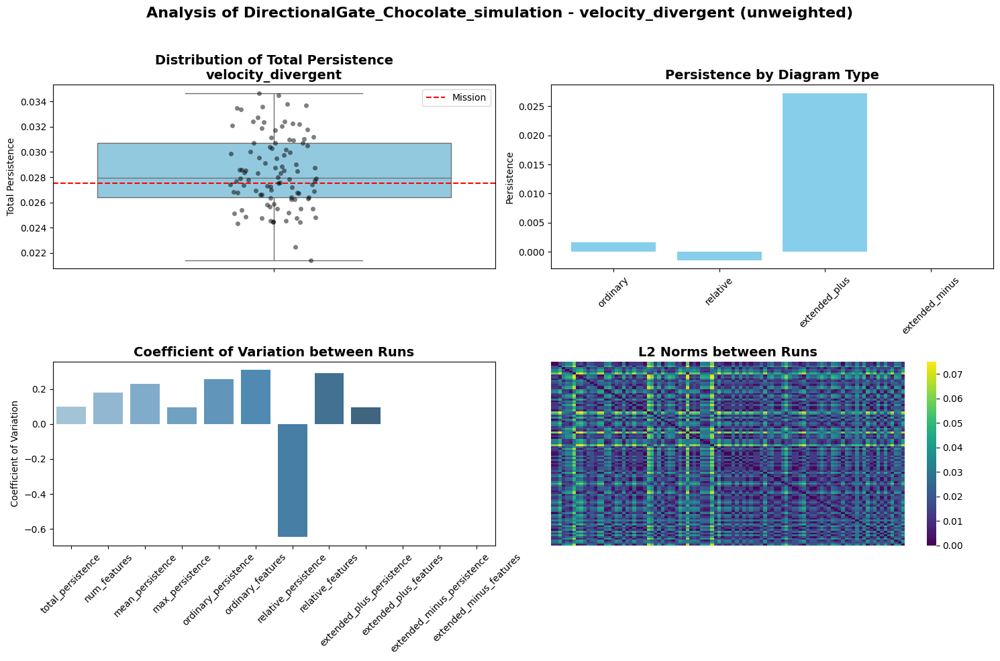

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


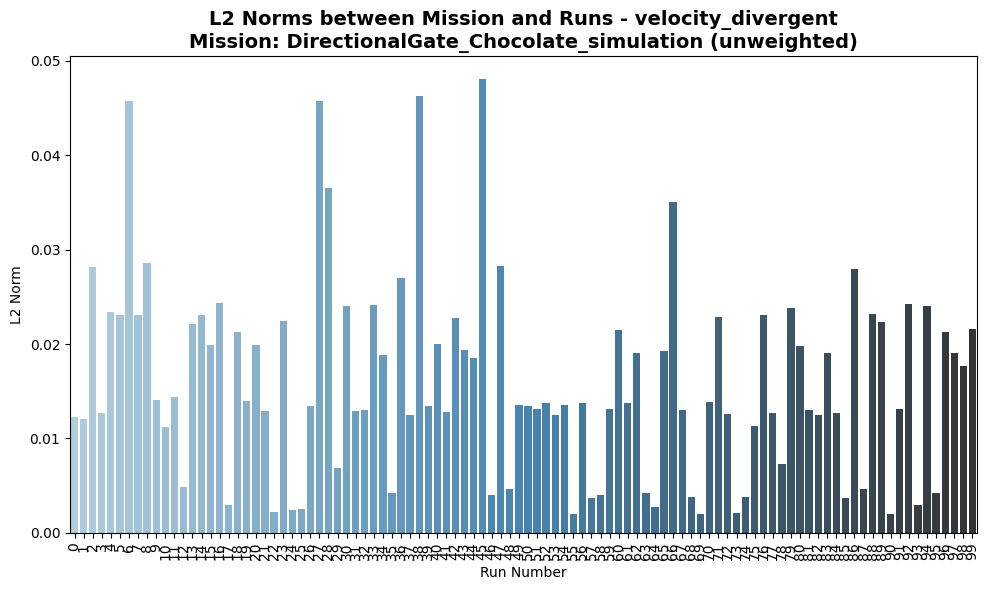

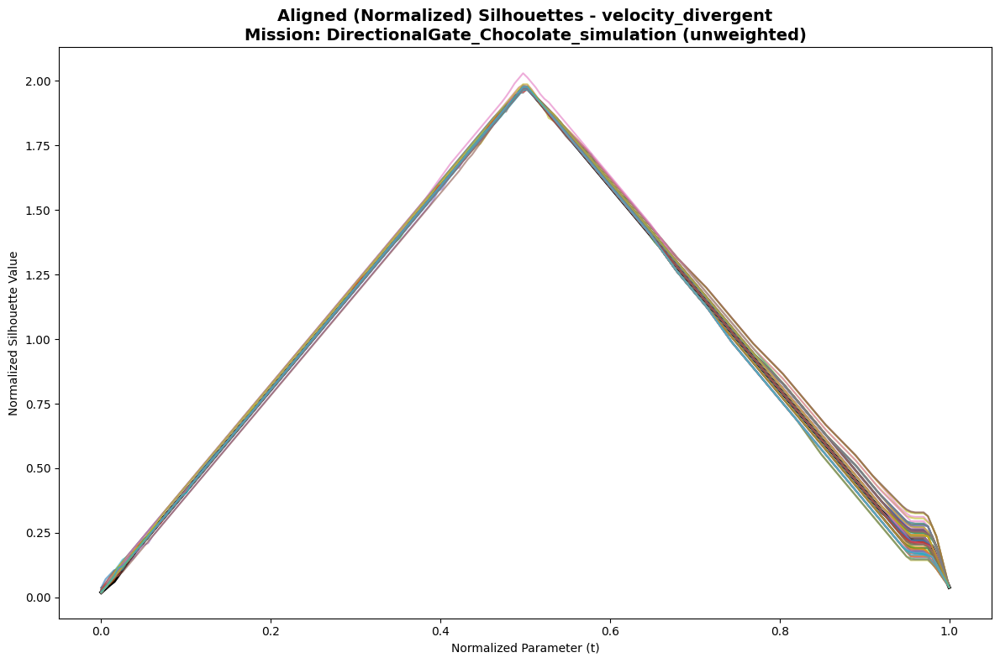

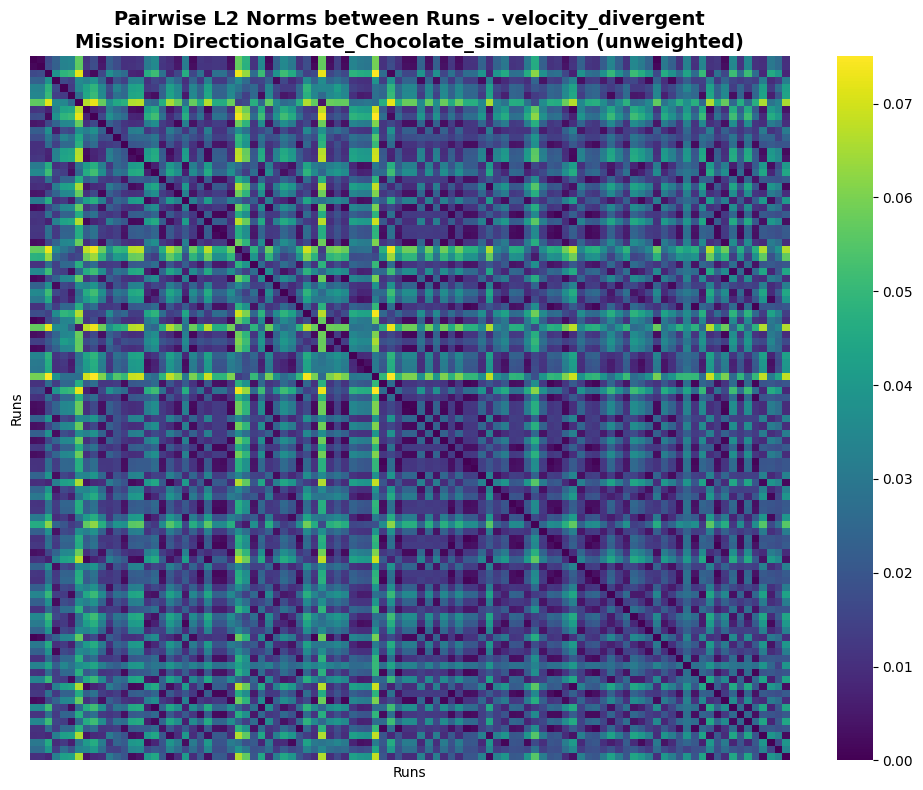

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


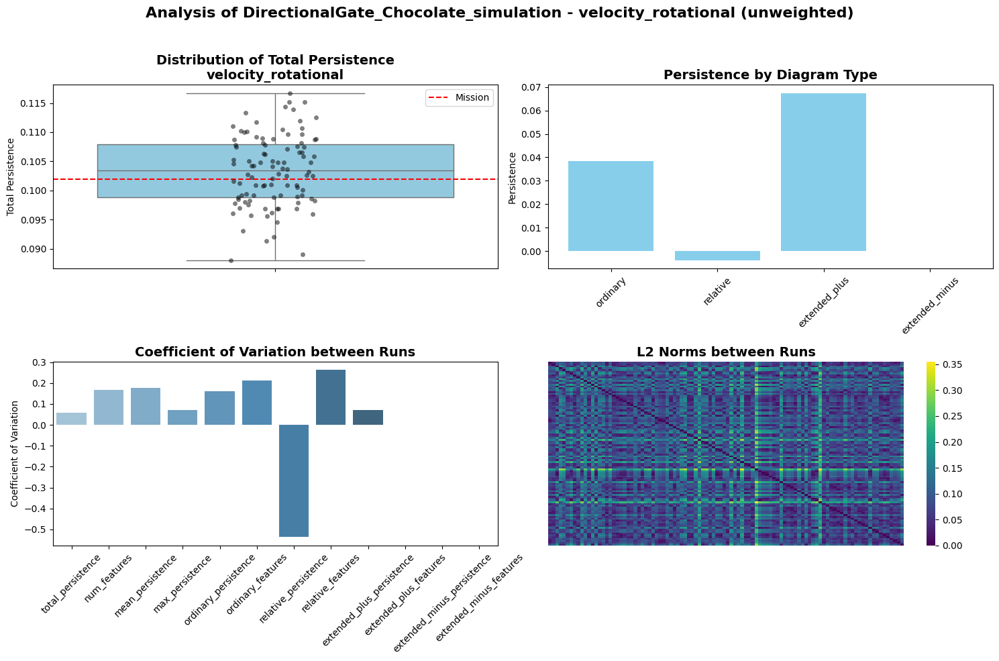

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


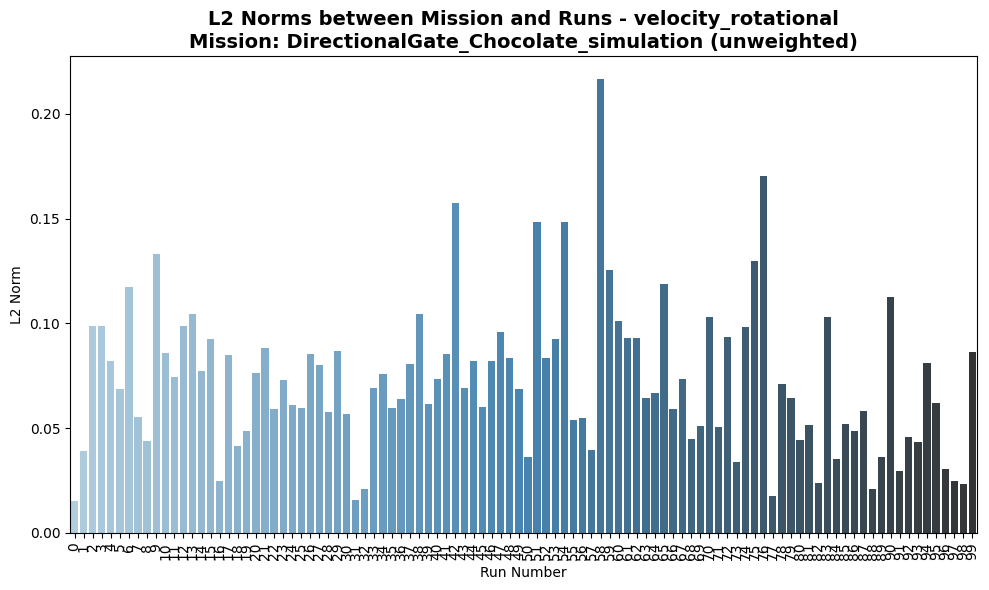

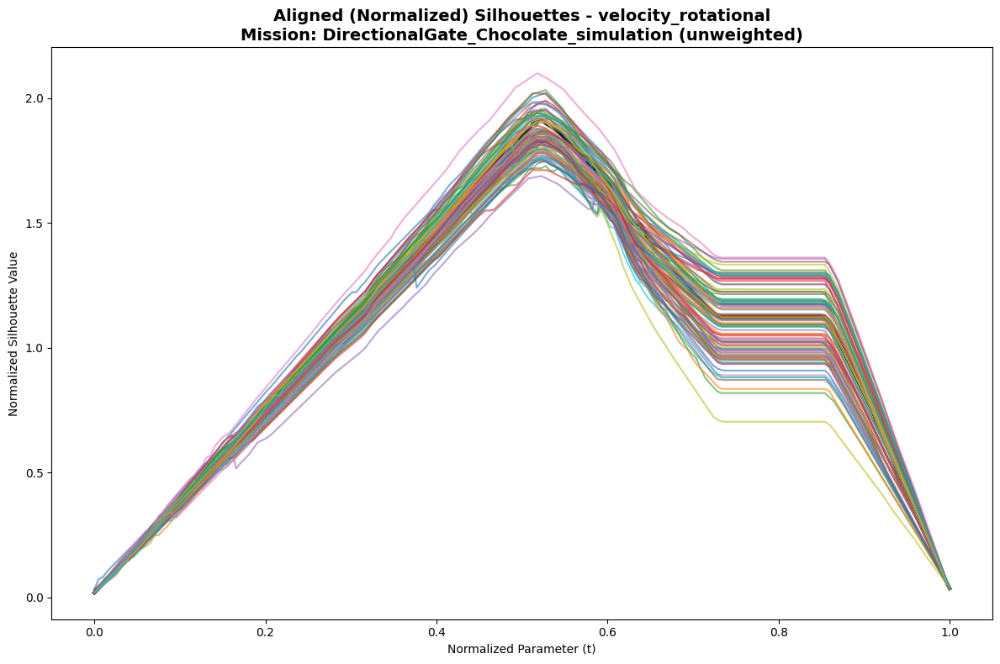

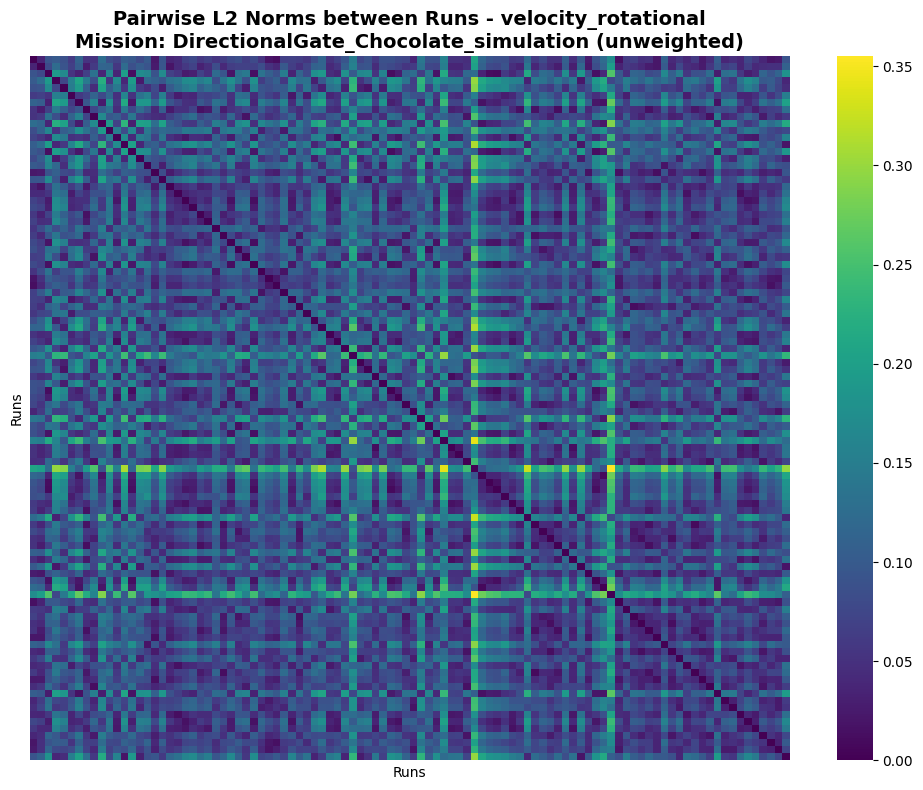

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


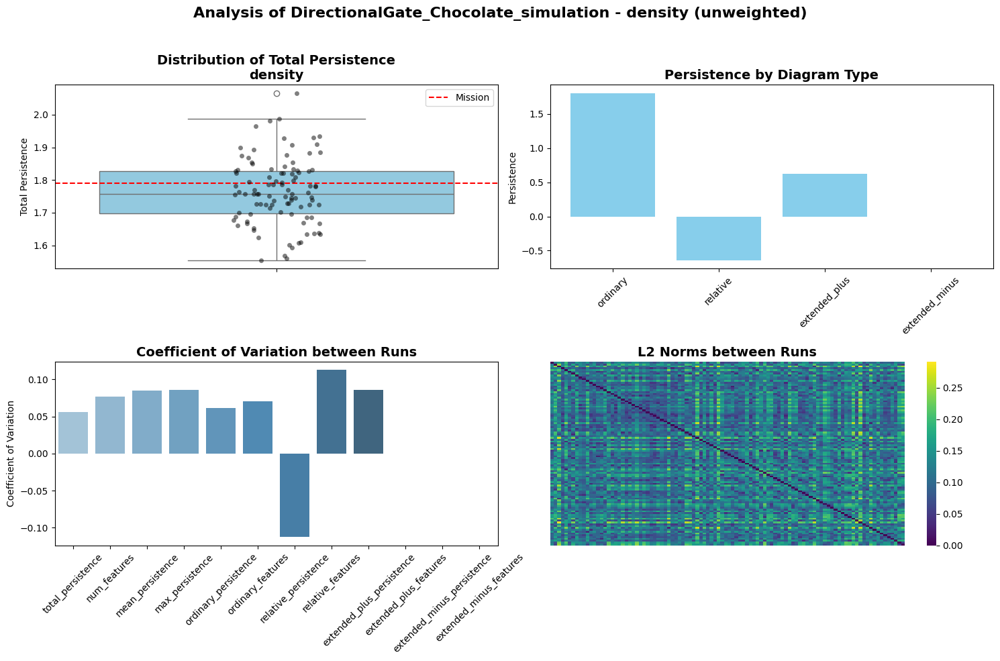

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


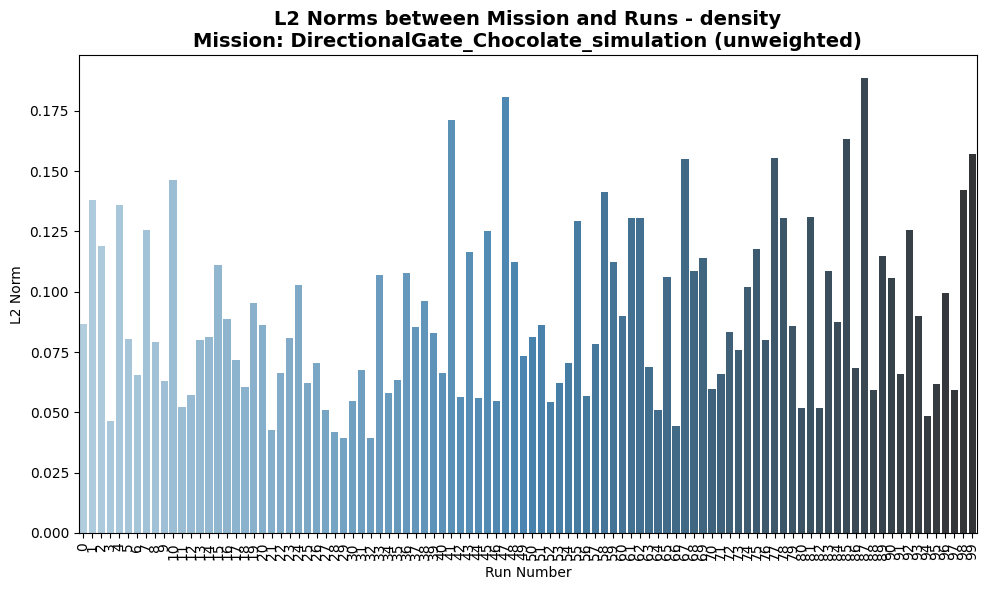

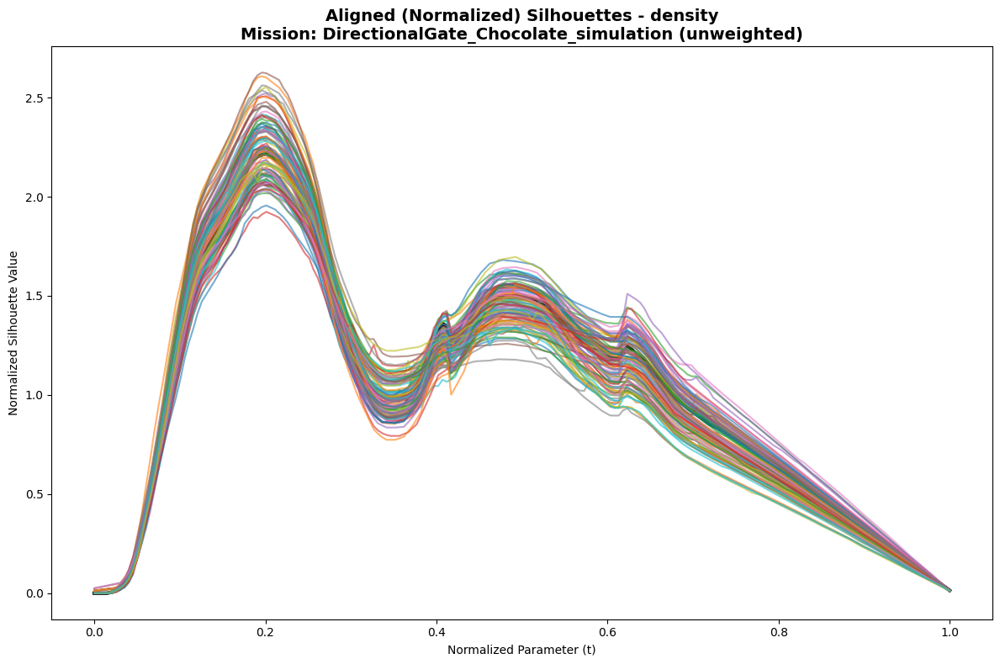

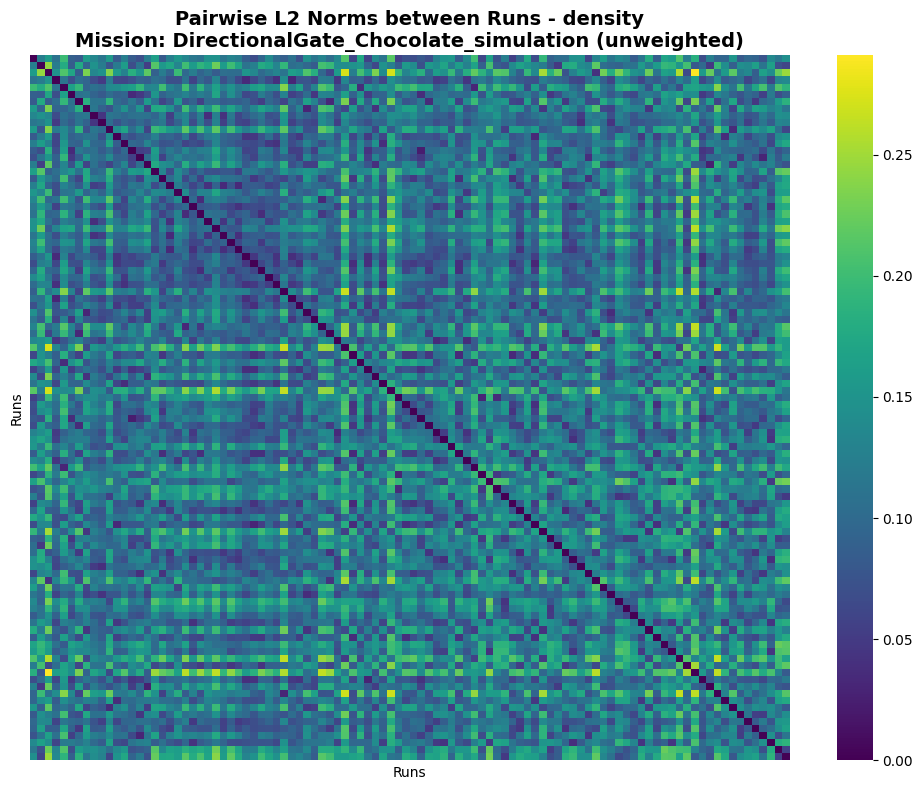


Analyzing Foraging_Chocolate_simulation

Analyzing mission: Foraging_Chocolate_simulation


/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_reso

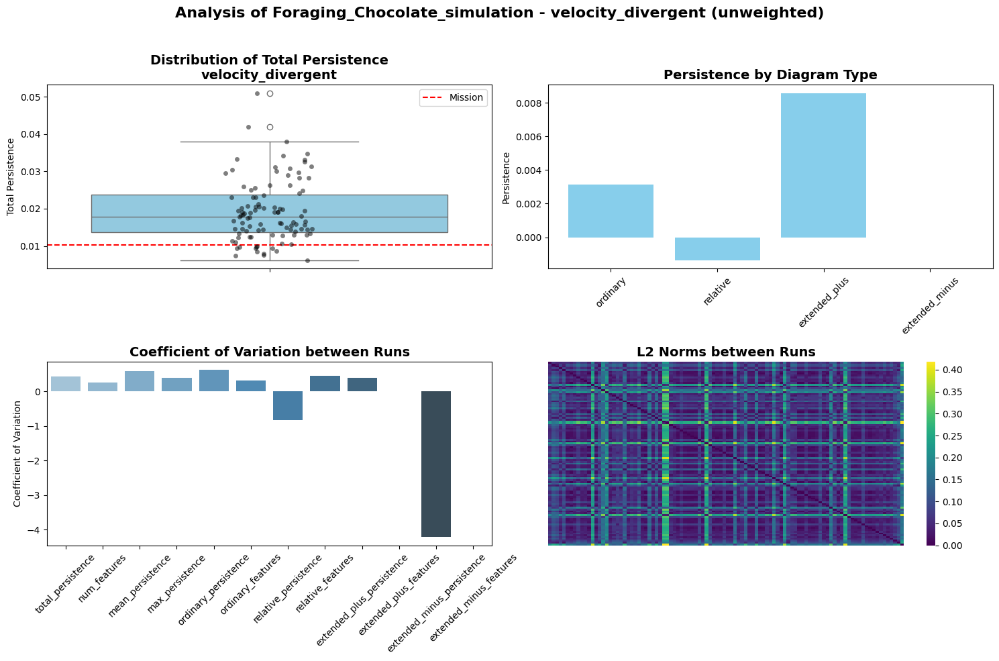

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


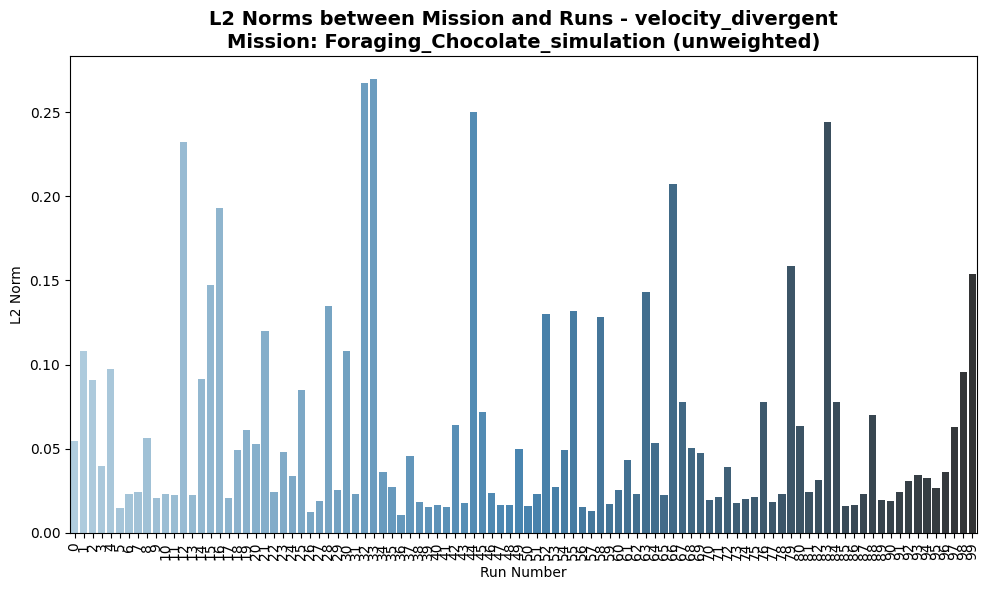

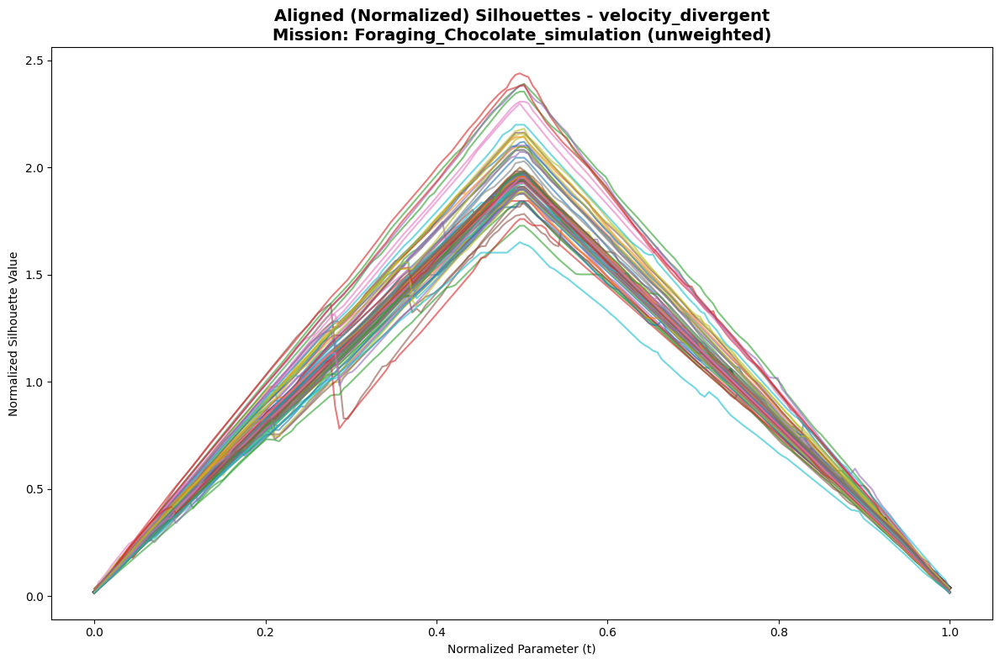

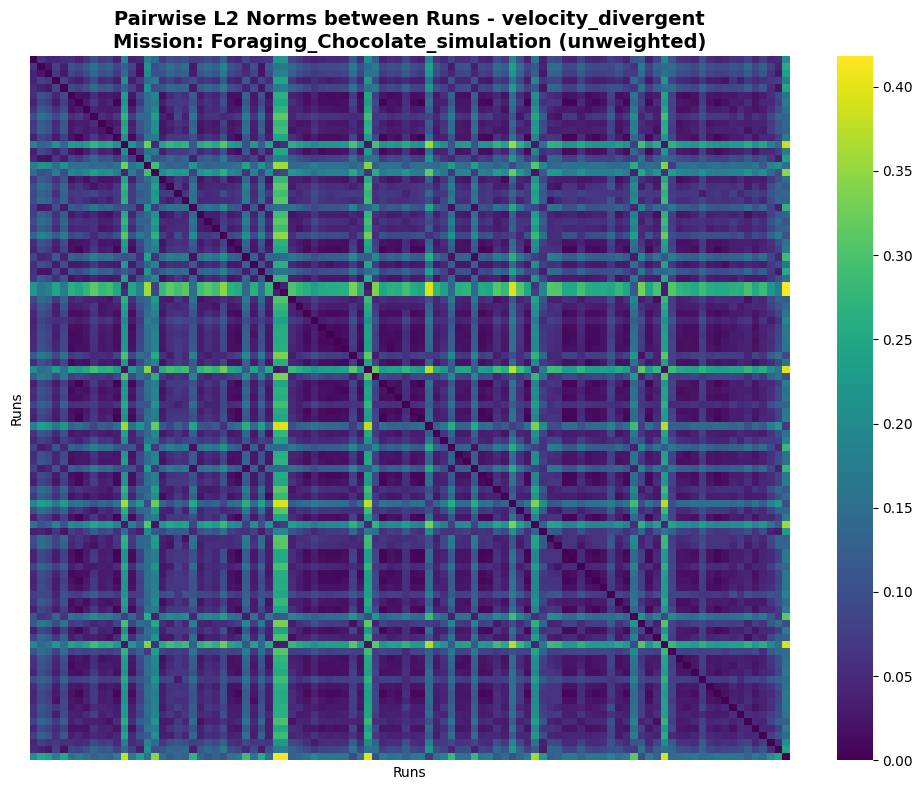

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


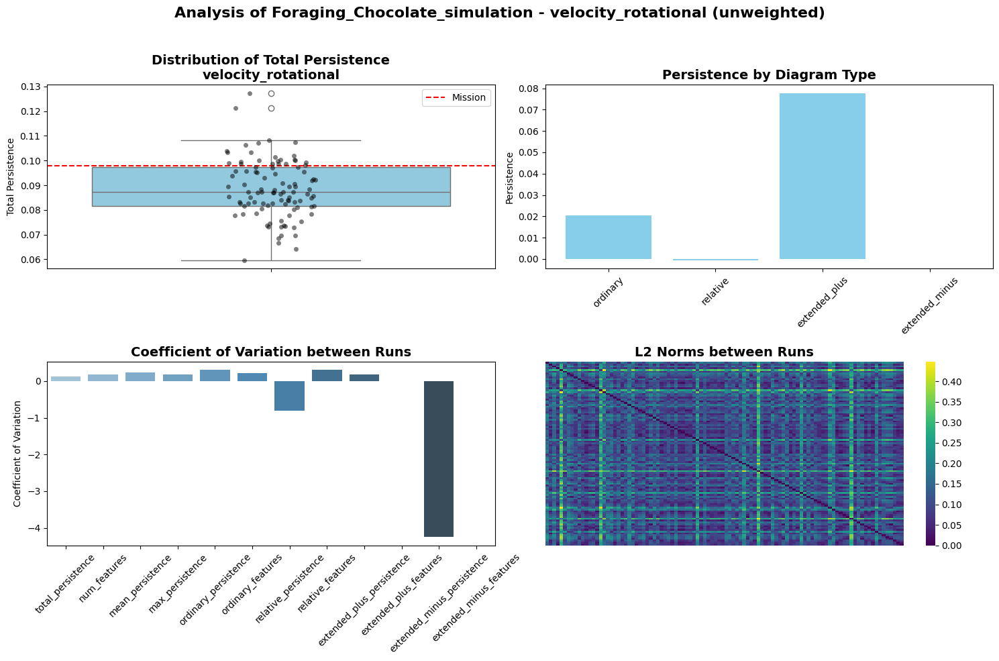

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


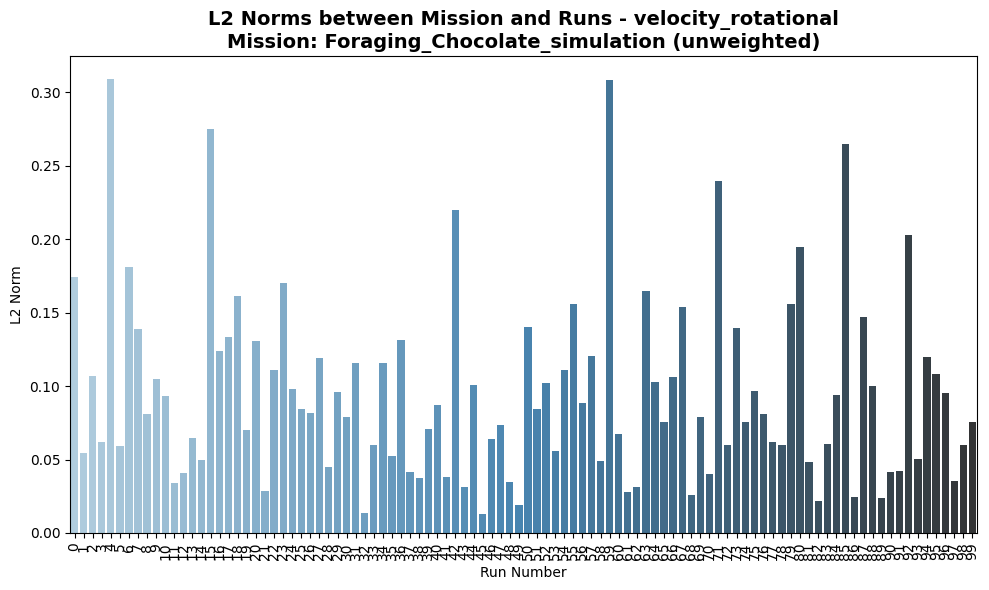

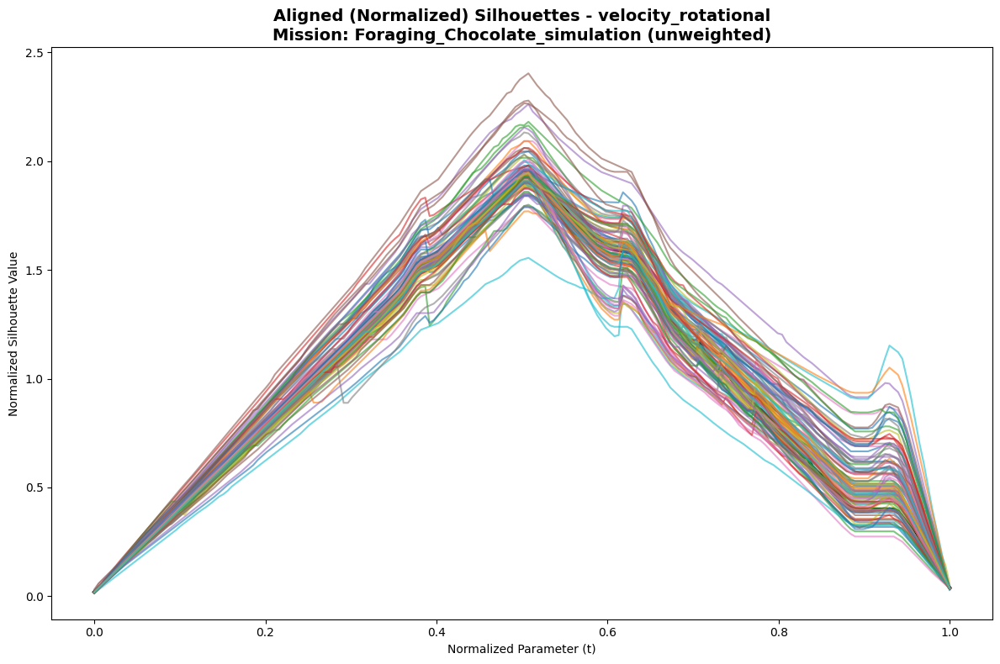

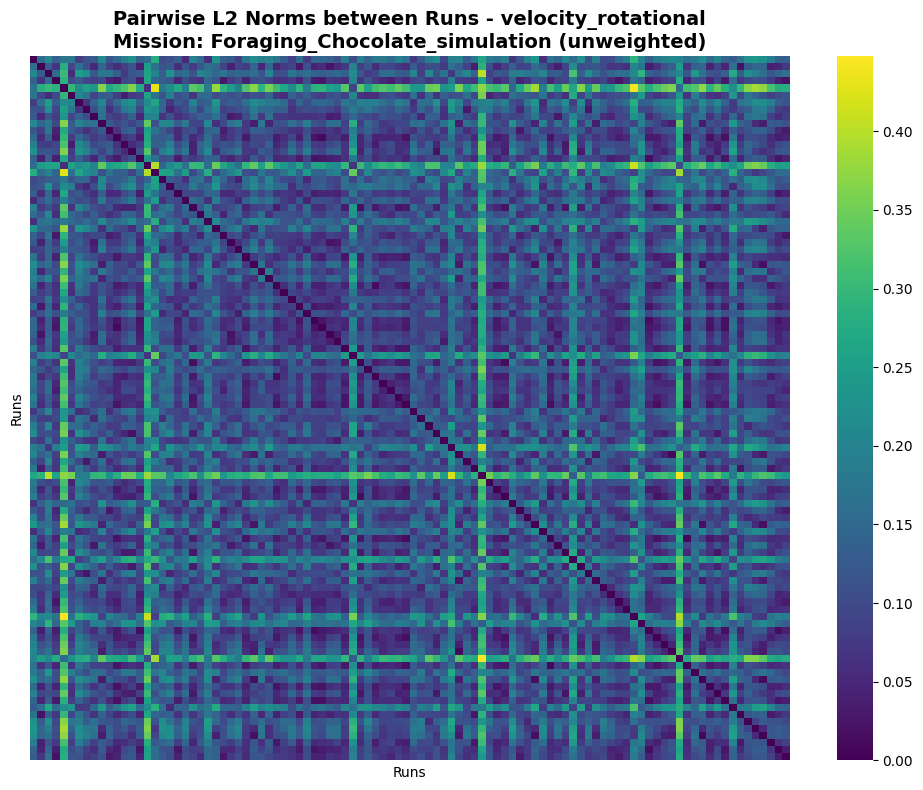

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


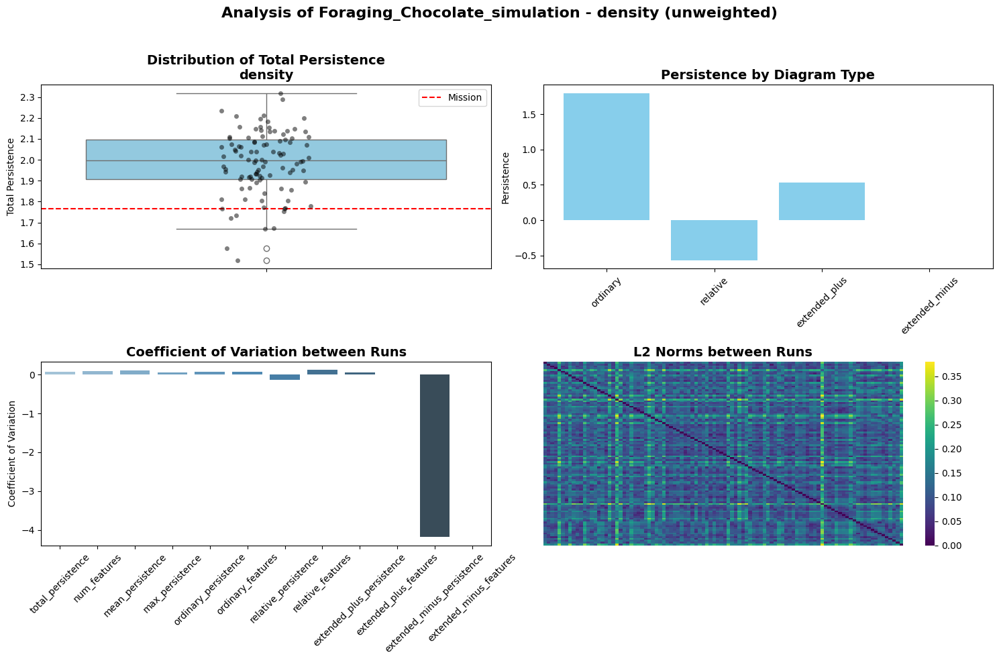

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


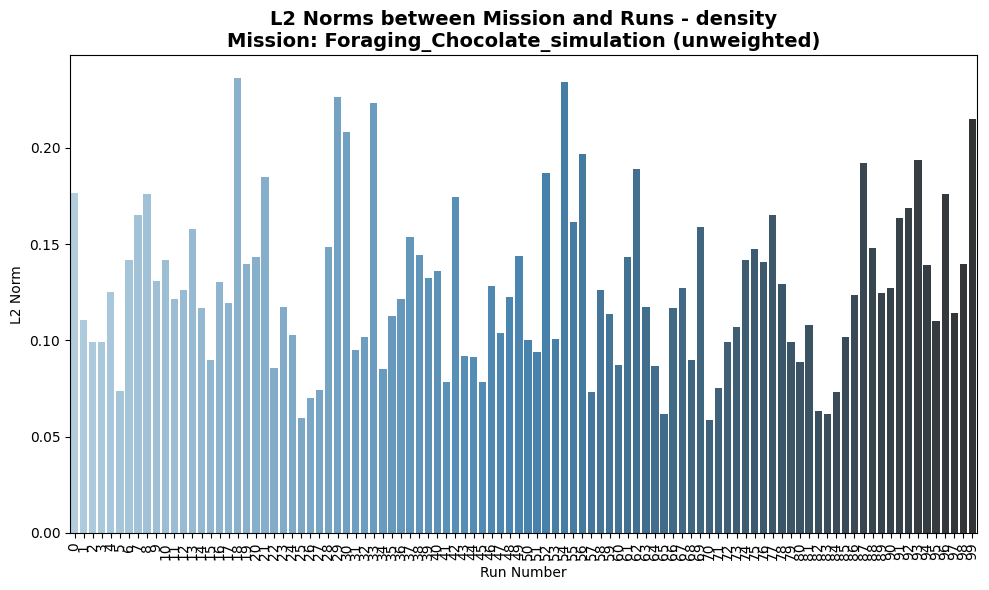

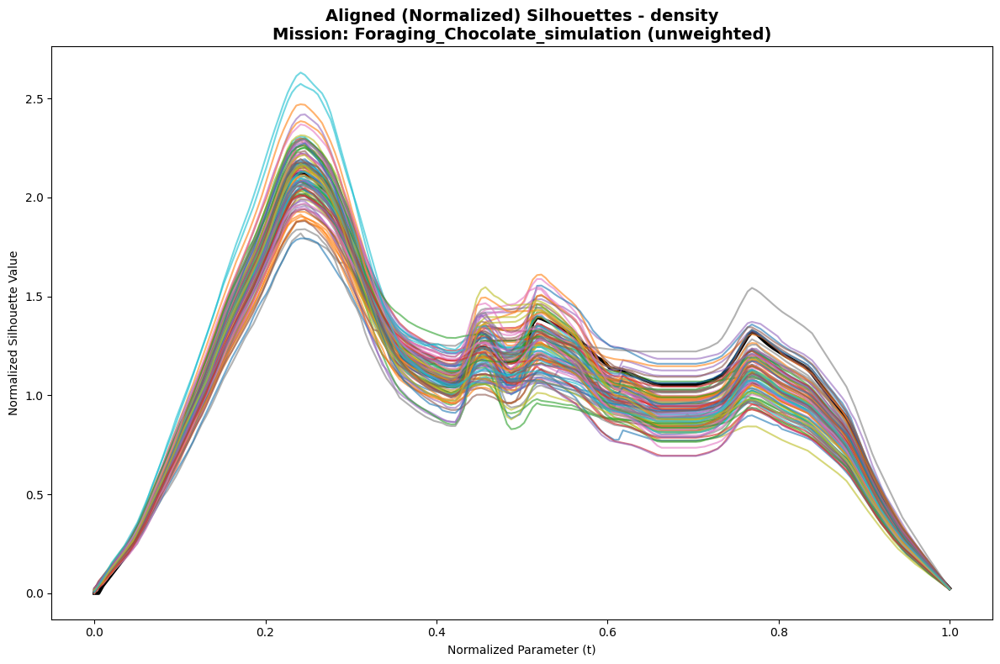

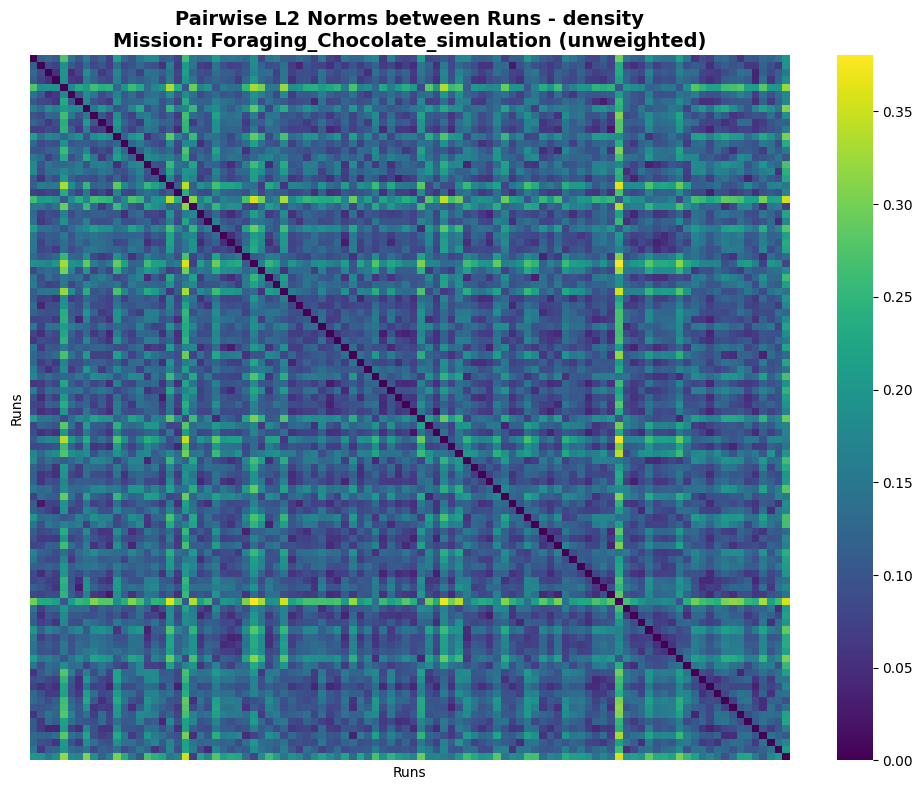


Analyzing Homing_Chocolate_simulation

Analyzing mission: Homing_Chocolate_simulation


/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_reso

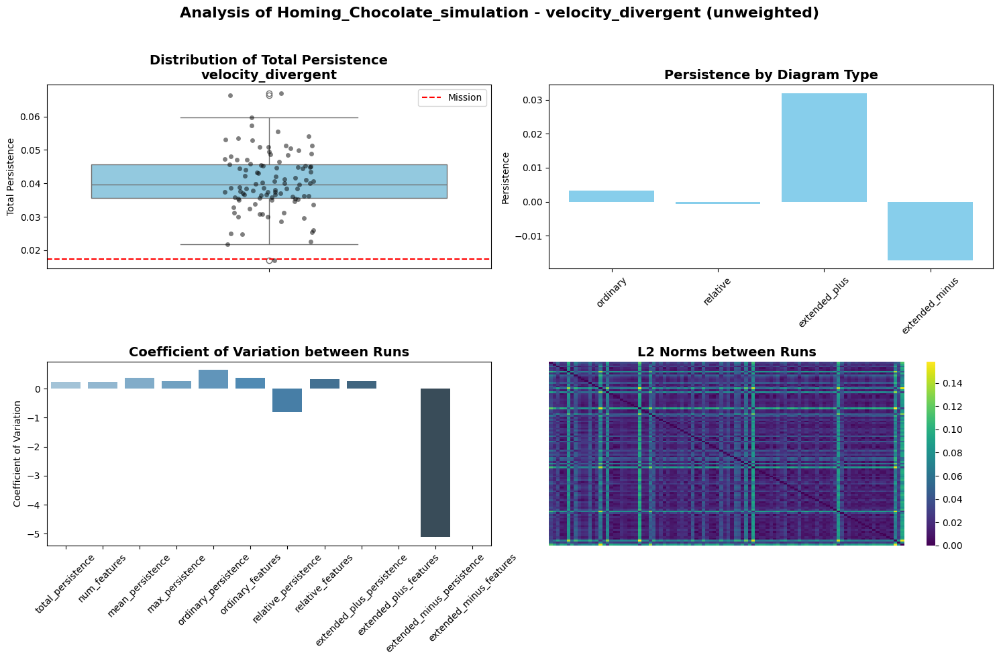

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


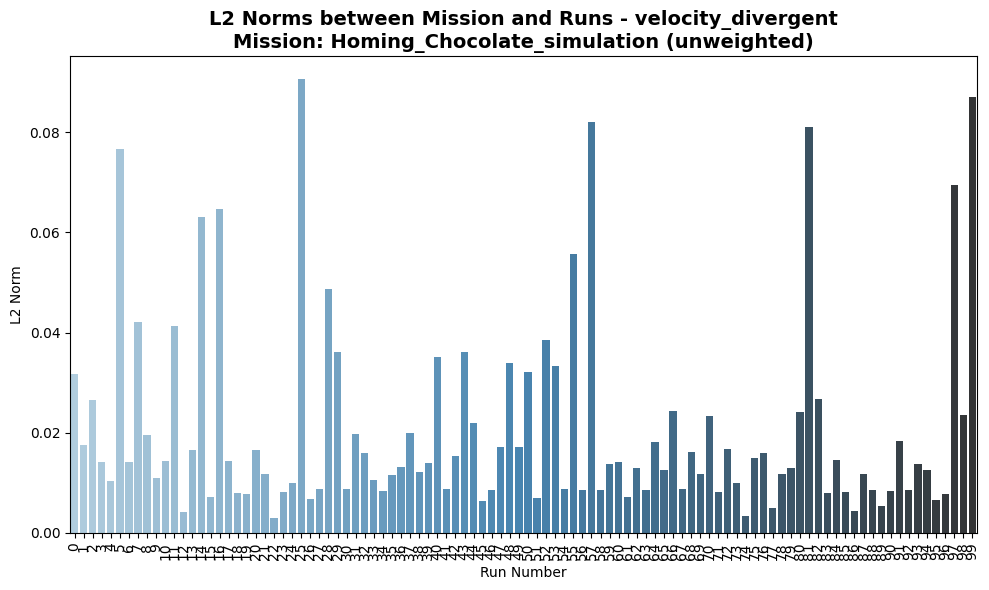

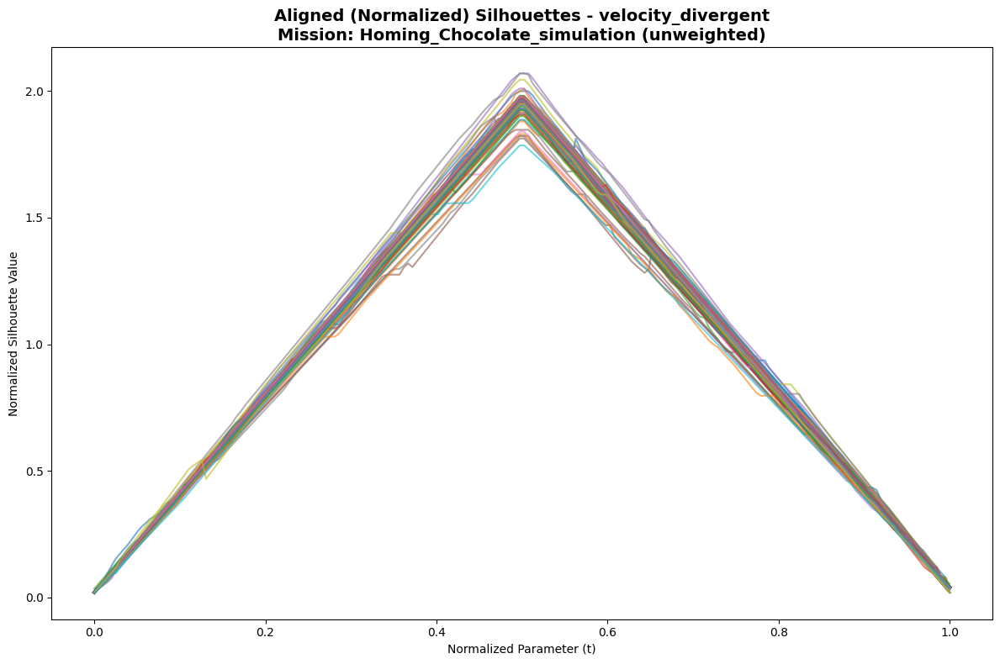

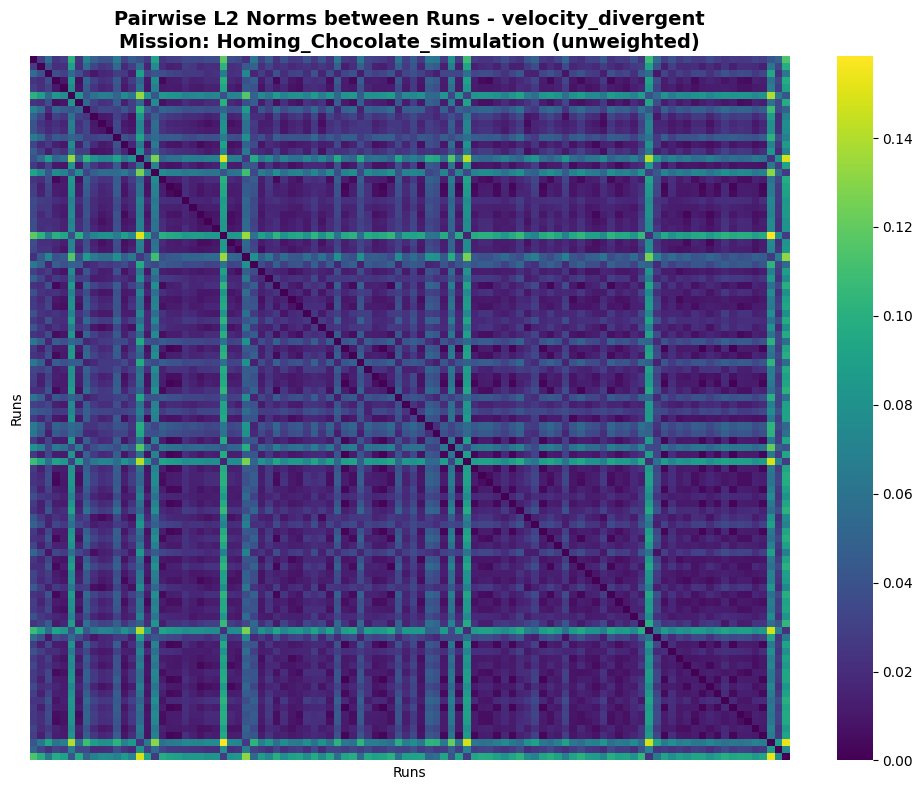

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


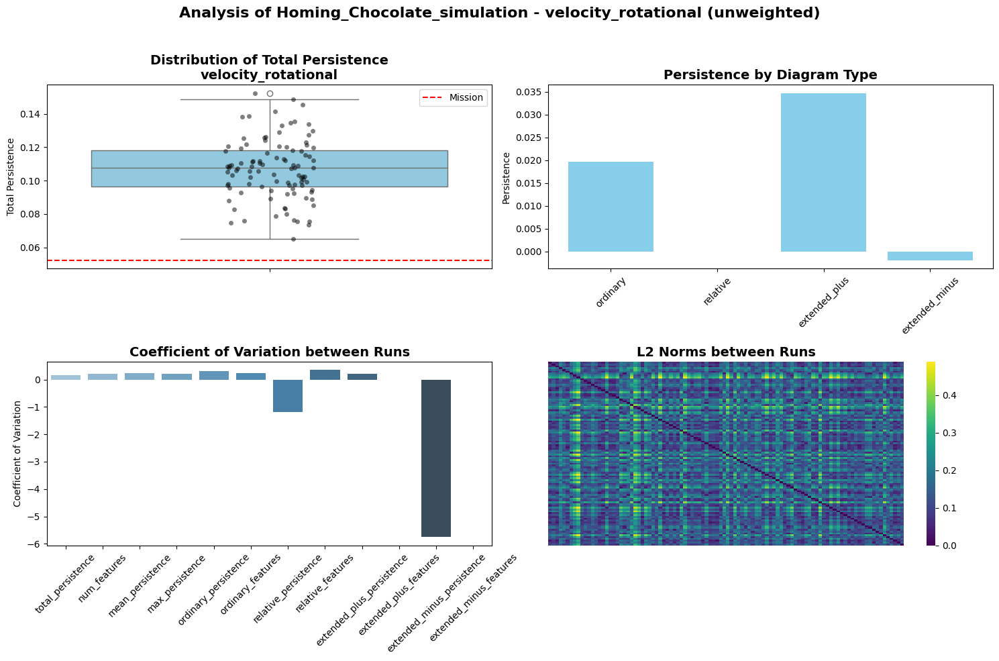

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


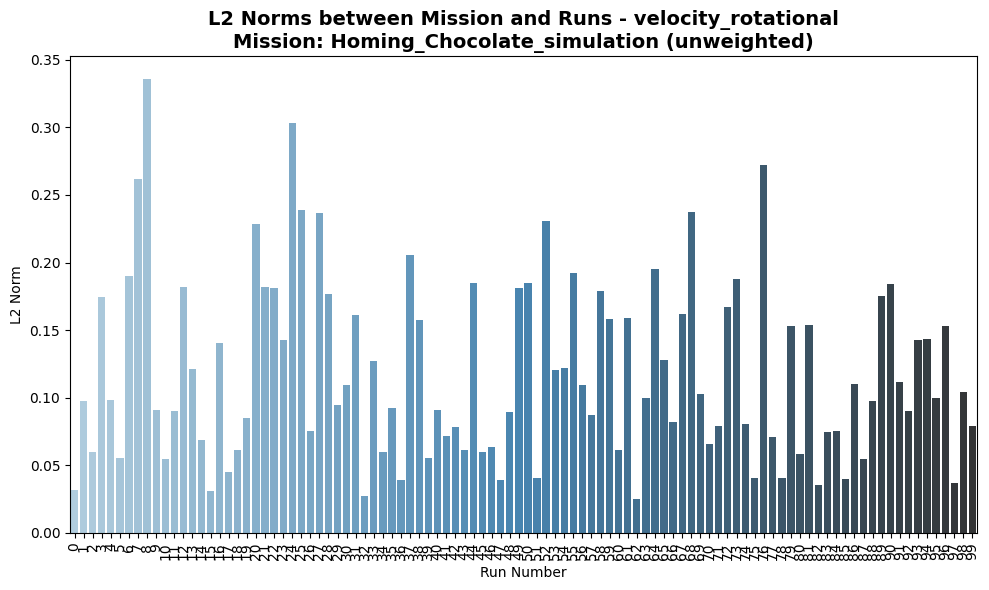

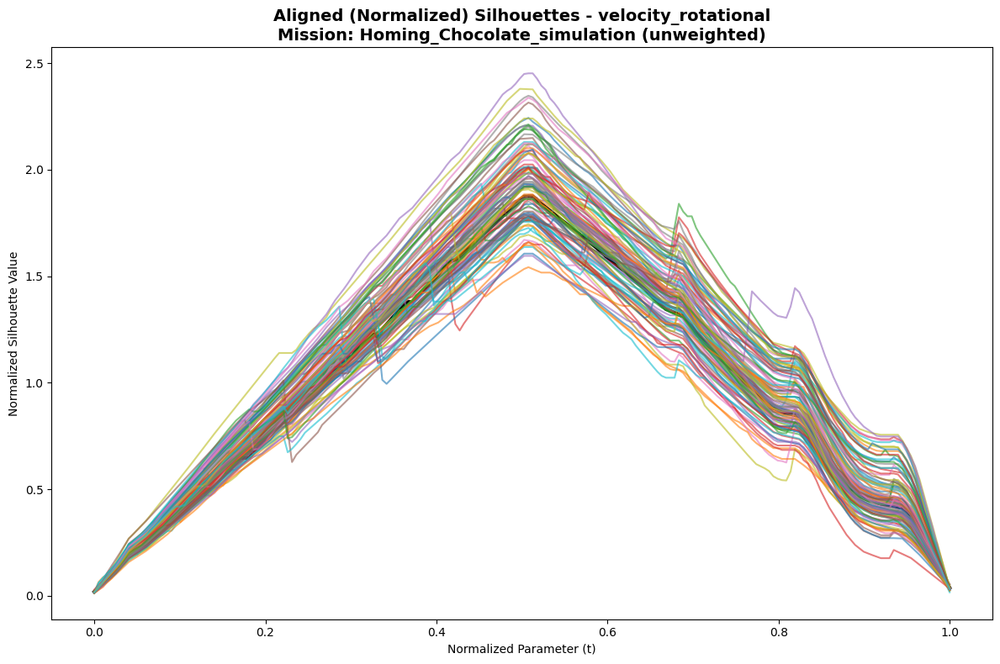

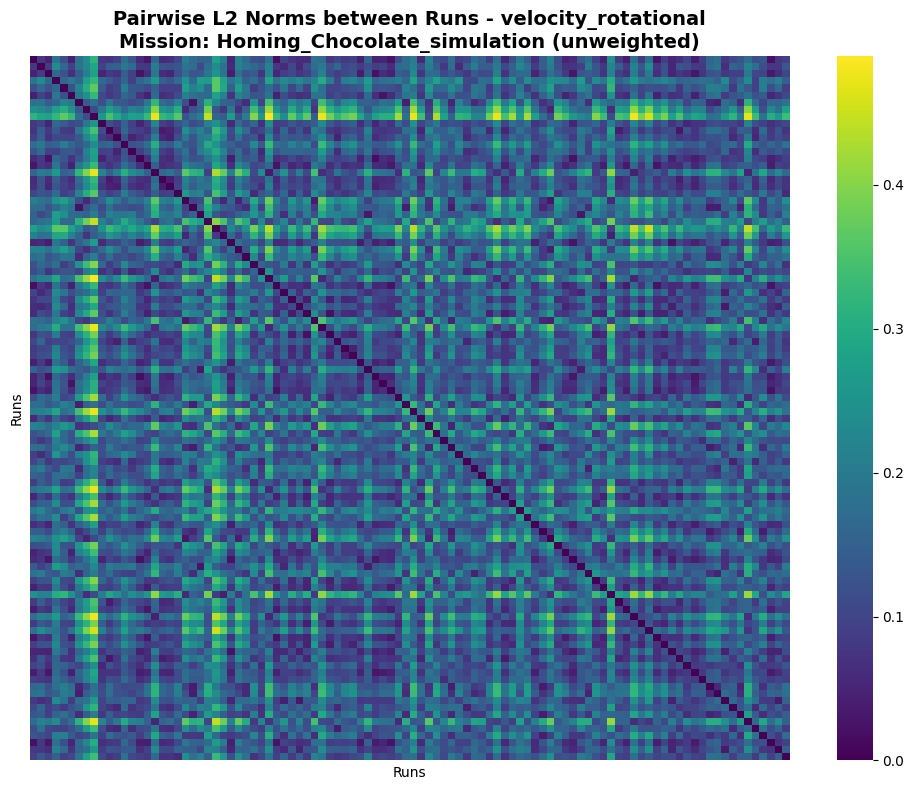

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


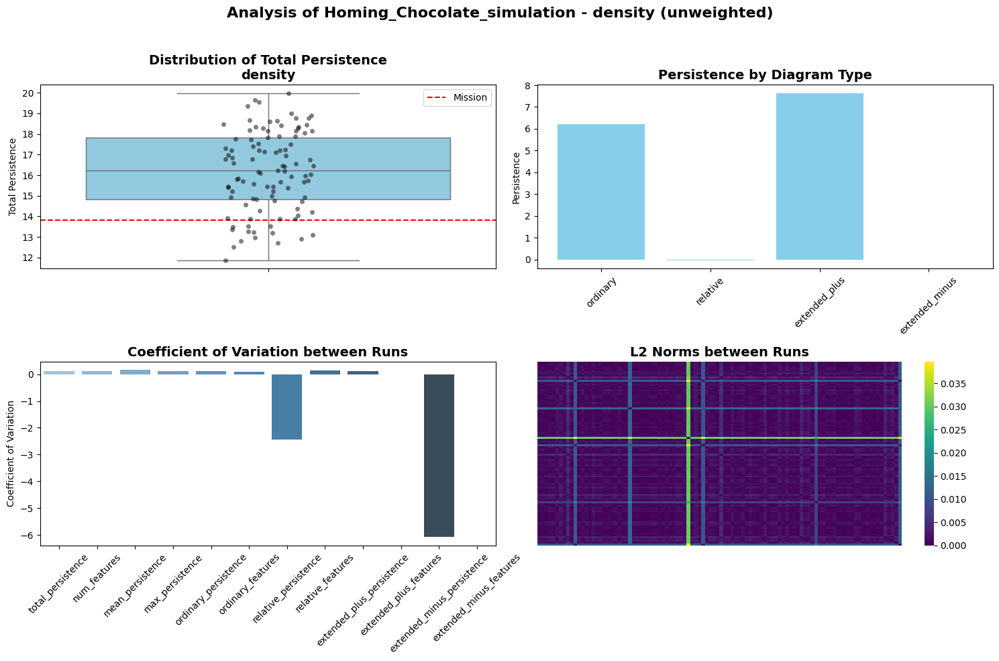

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


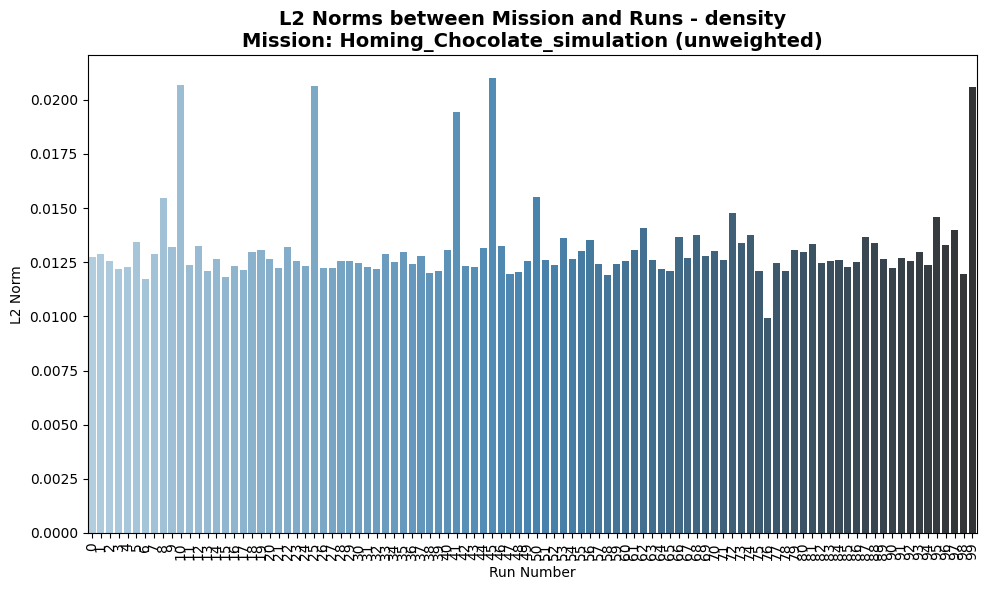

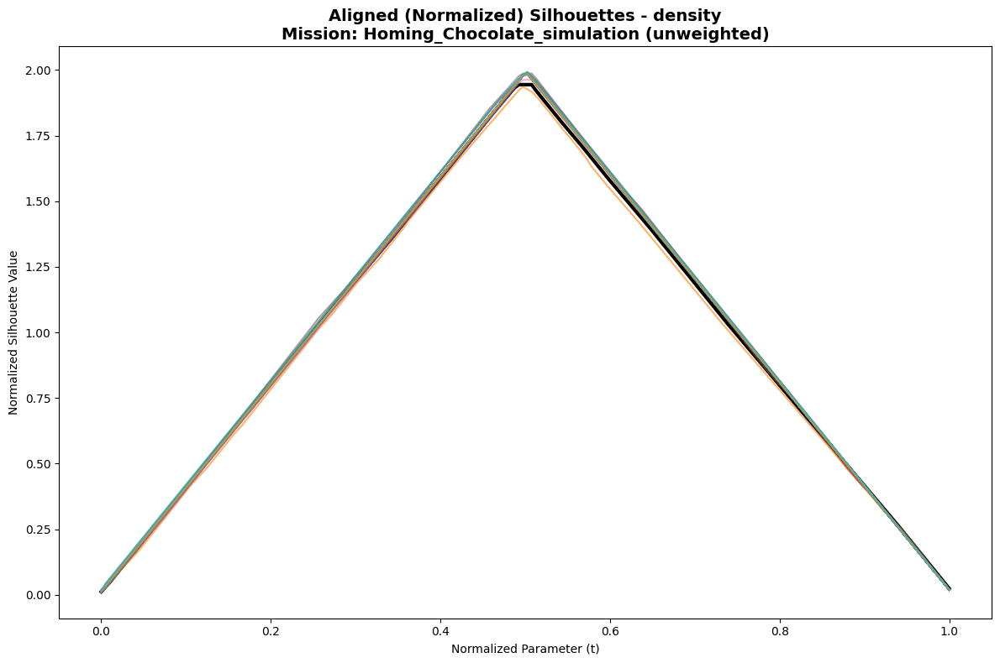

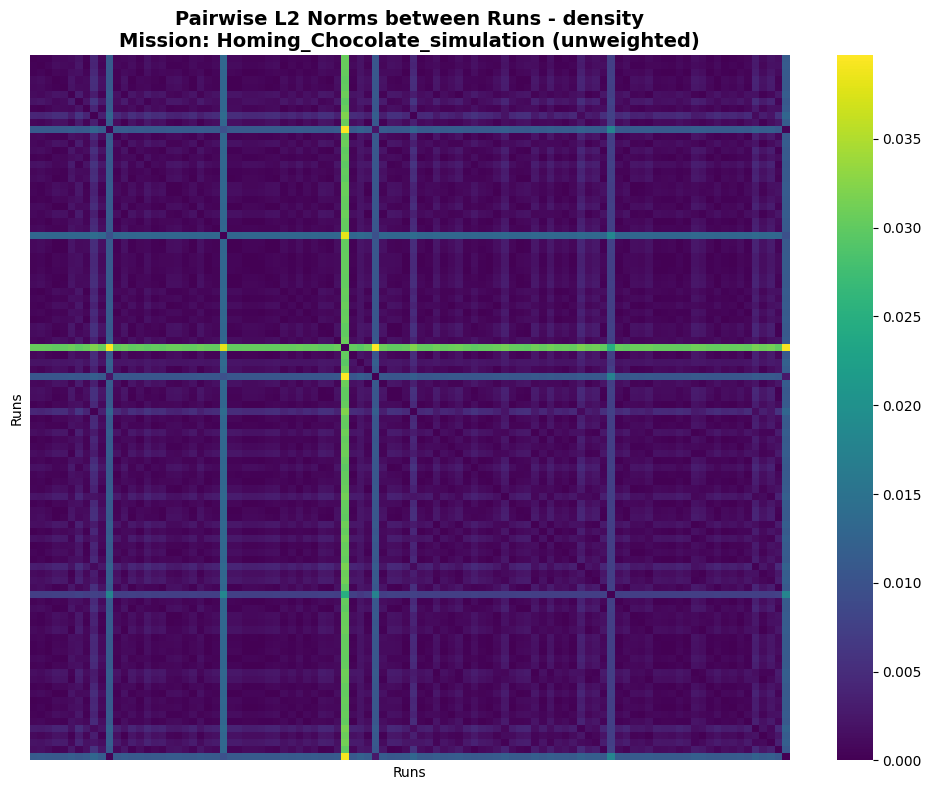


Analyzing Shelter_Chocolate_simulation

Analyzing mission: Shelter_Chocolate_simulation


/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_reso

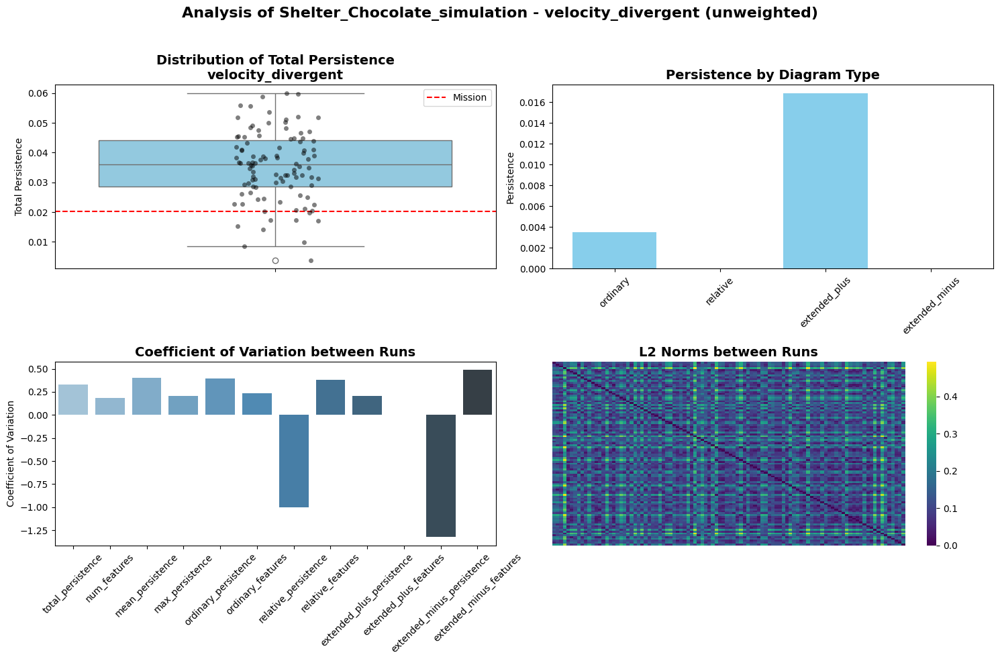

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


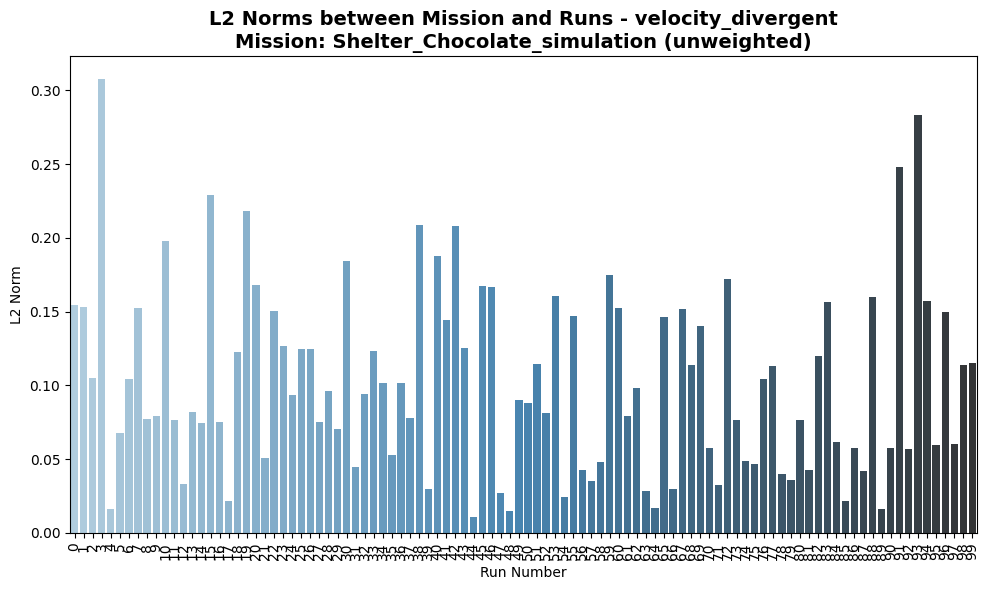

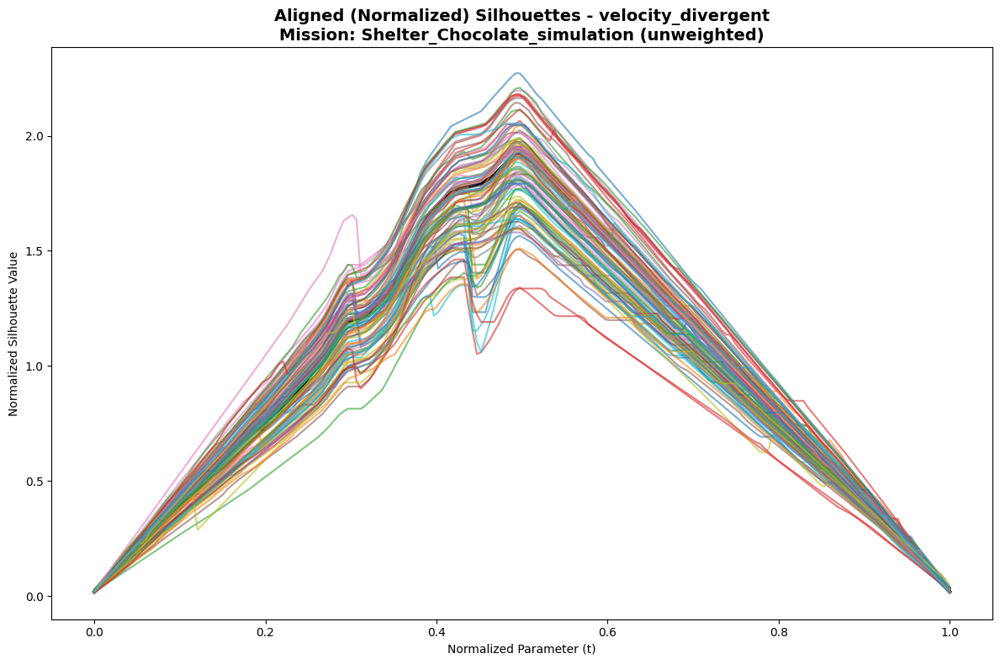

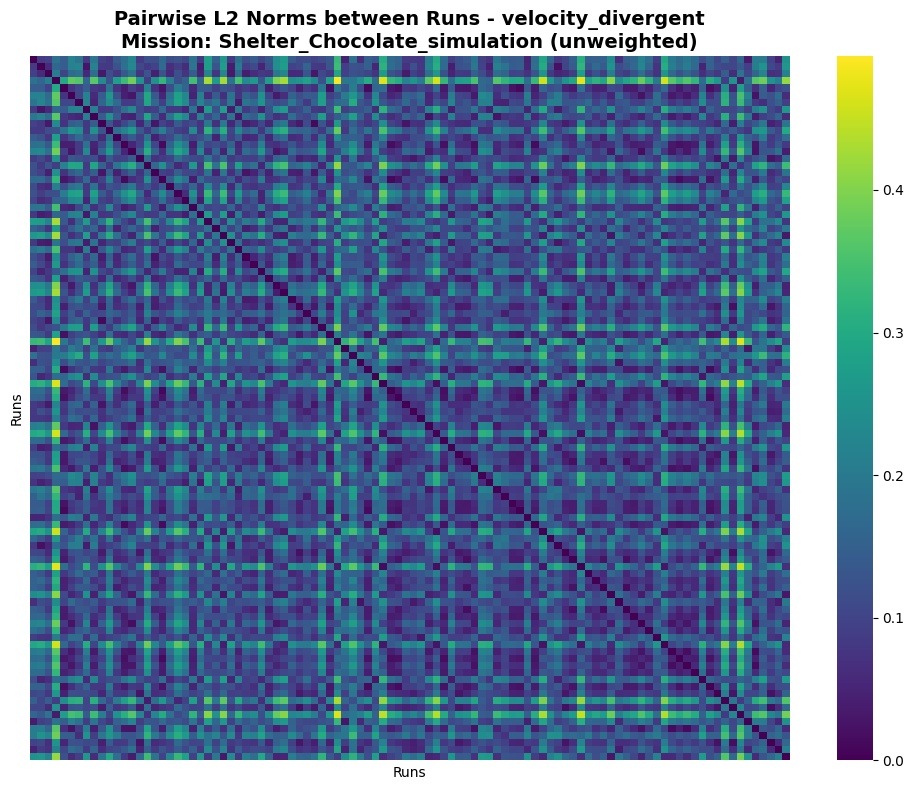

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


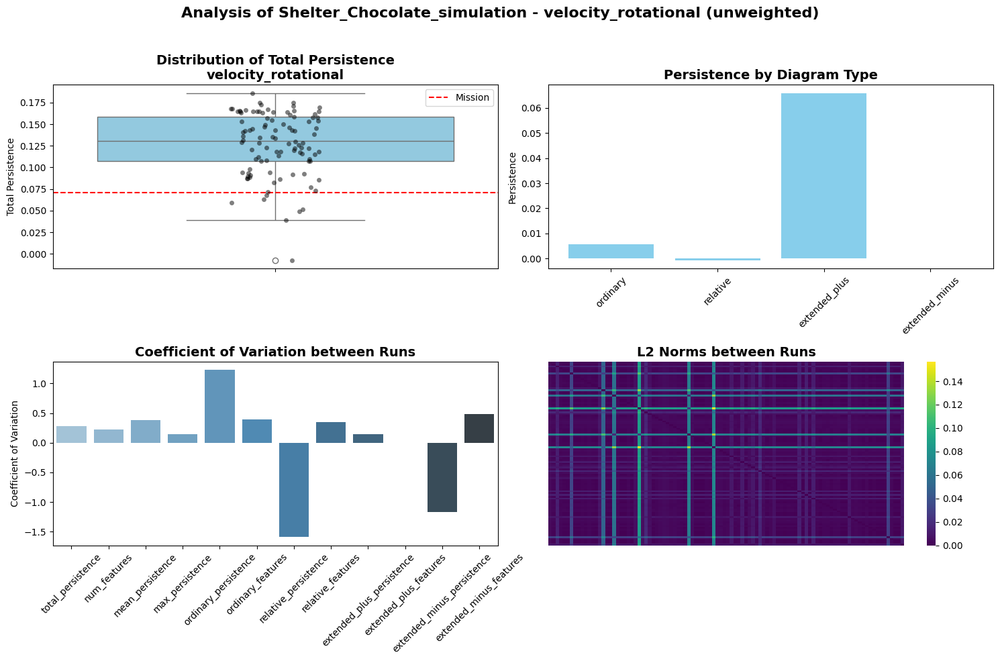

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


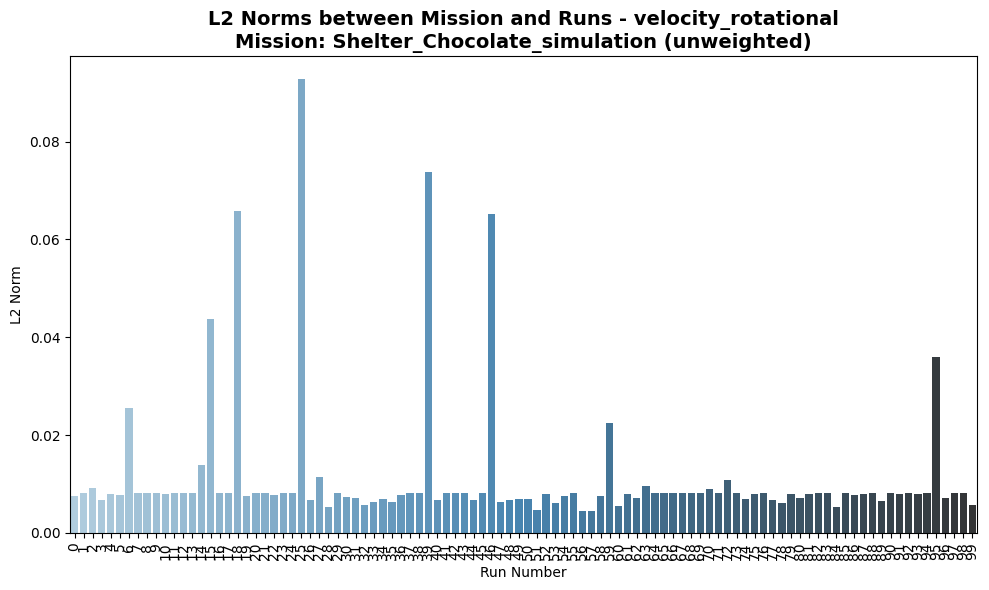

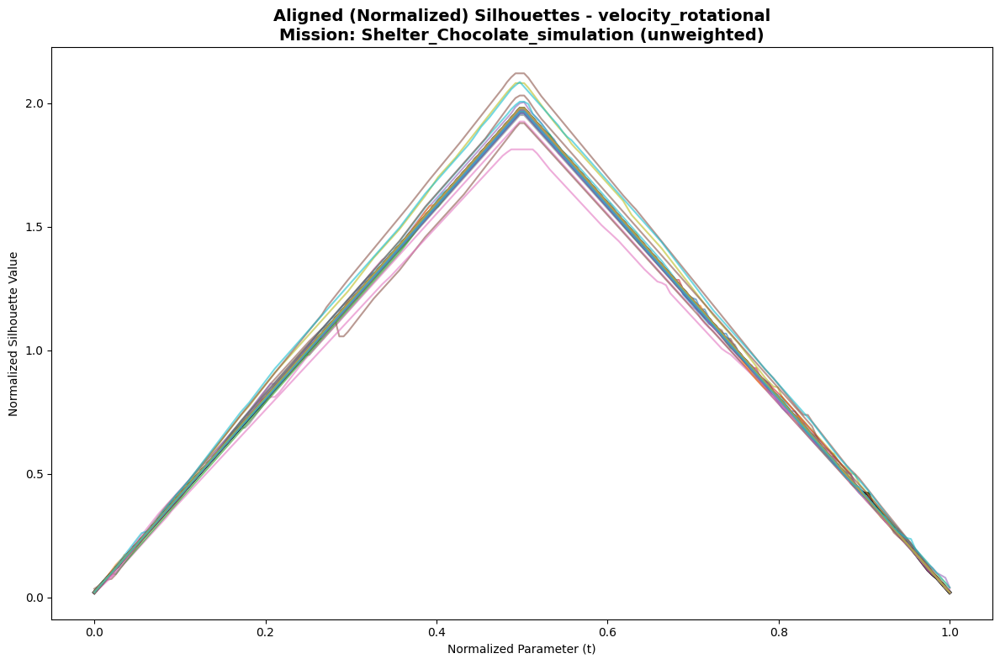

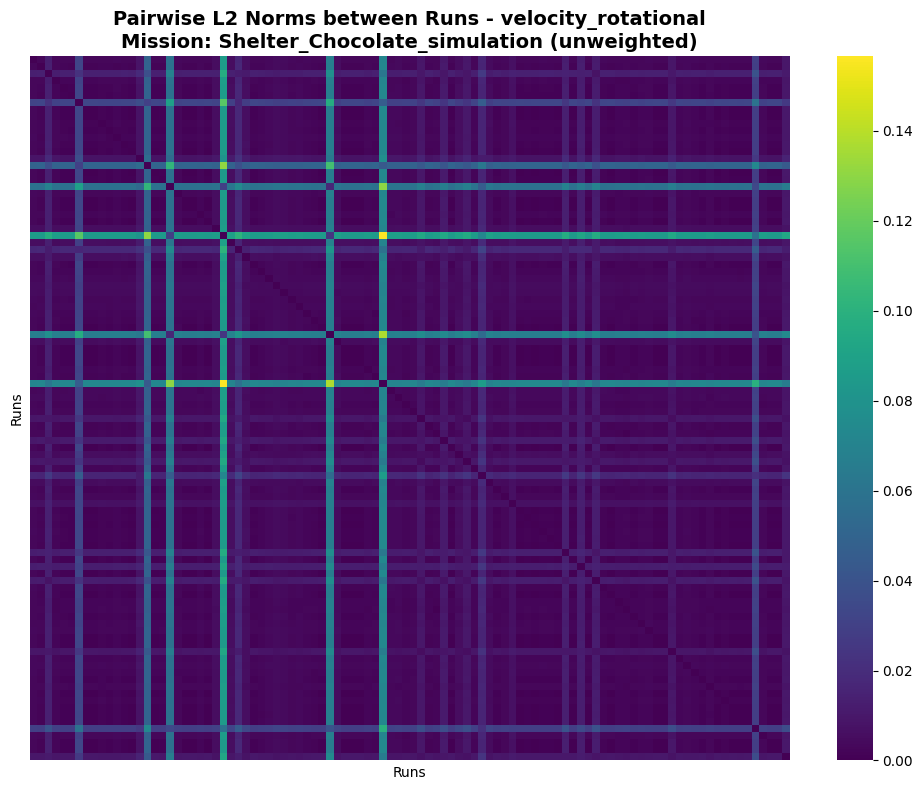

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


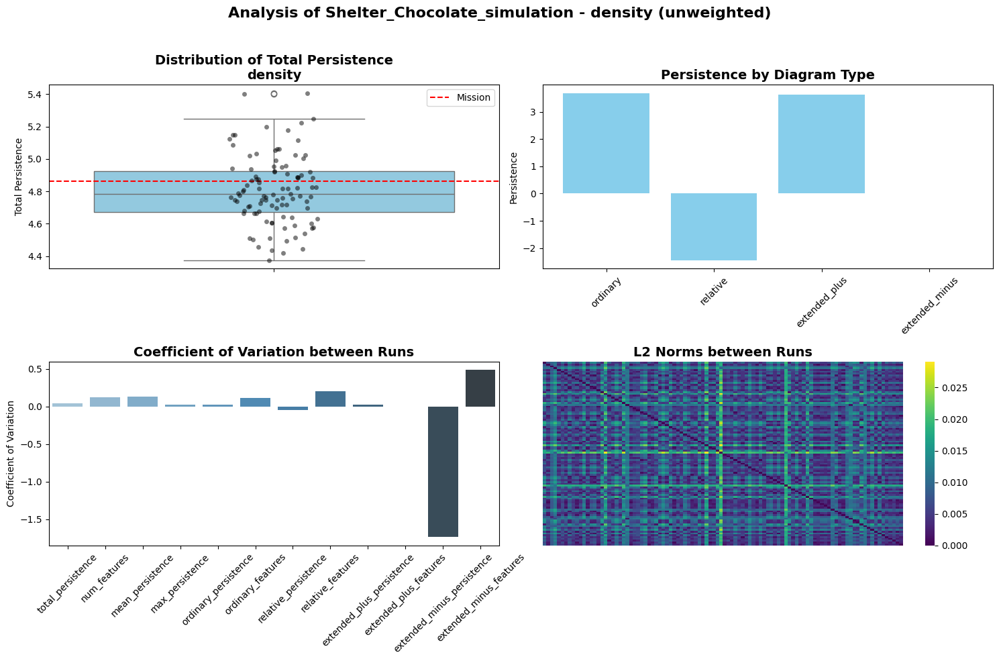

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


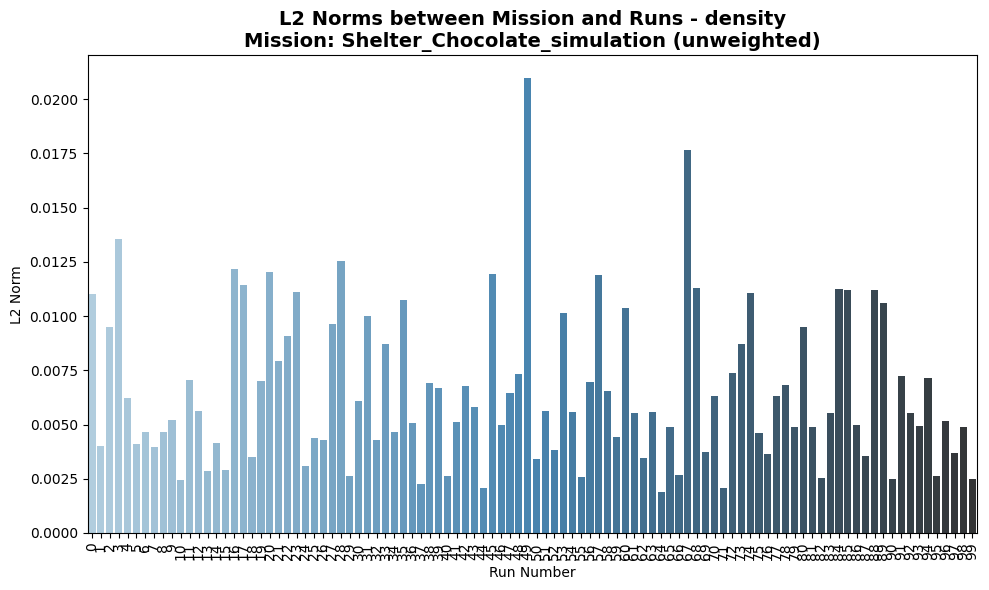

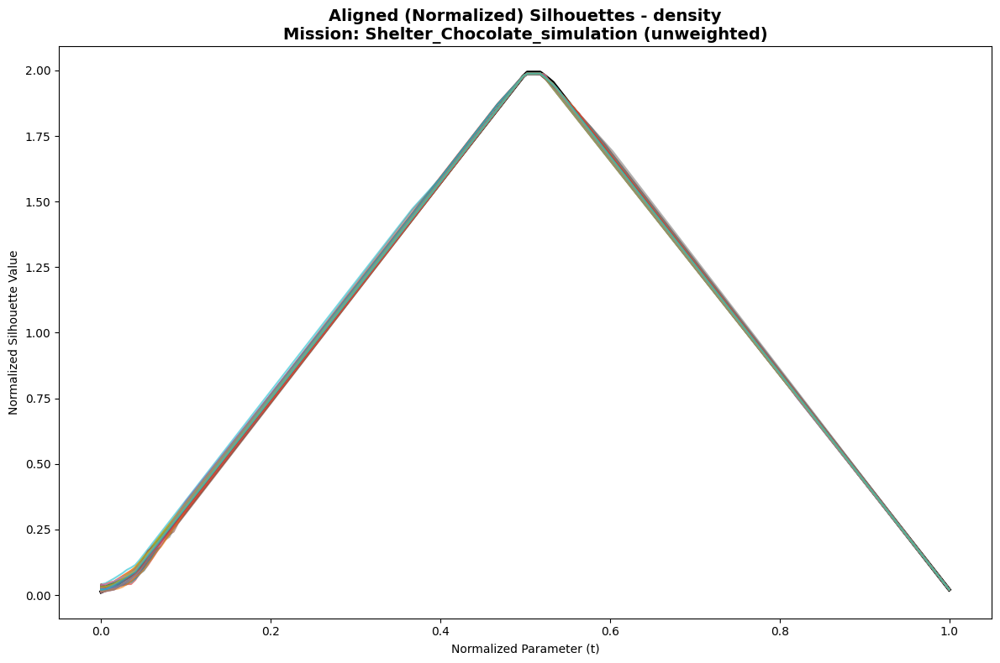

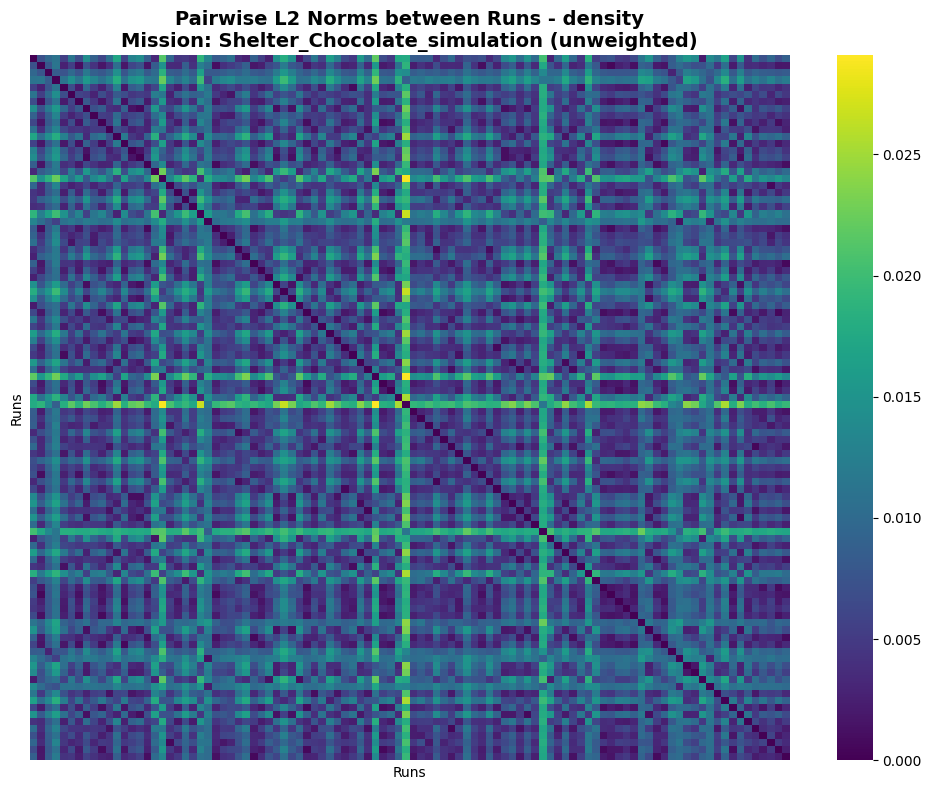


Analyzing XOR-Aggregation_Chocolate_simulation

Analyzing mission: XOR-Aggregation_Chocolate_simulation


/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_resolution)
/tmp/ipykernel_69499/684757276.py:71: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  total_area = np.trapz(silhouette_function, dx=1/self.silhouette_reso

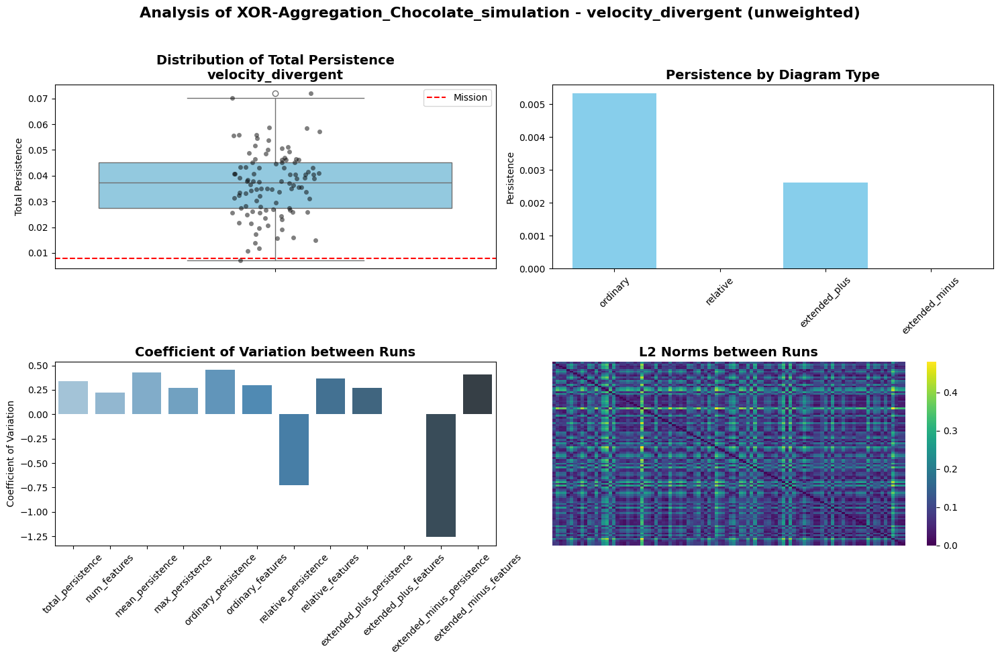

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


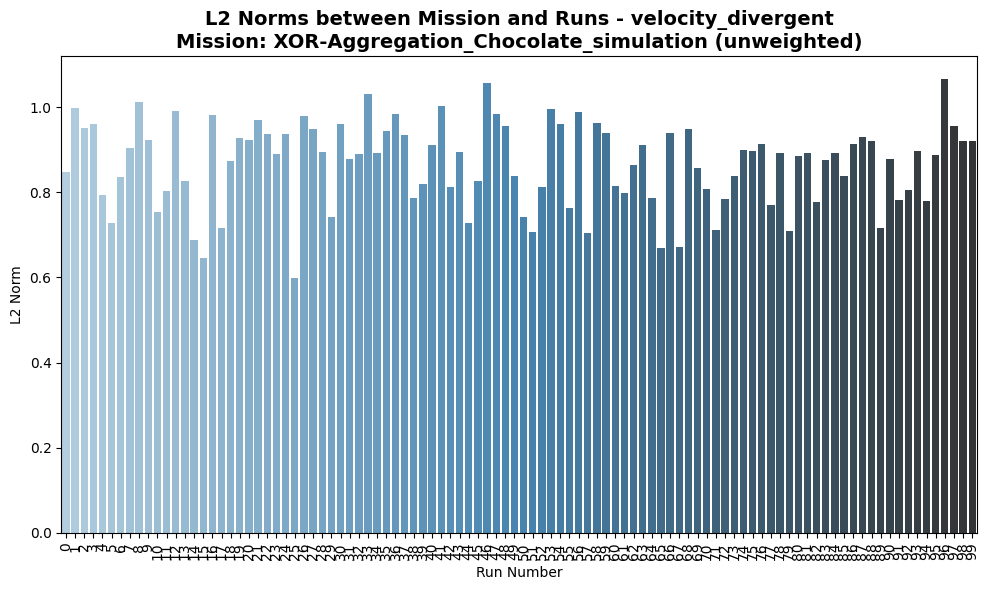

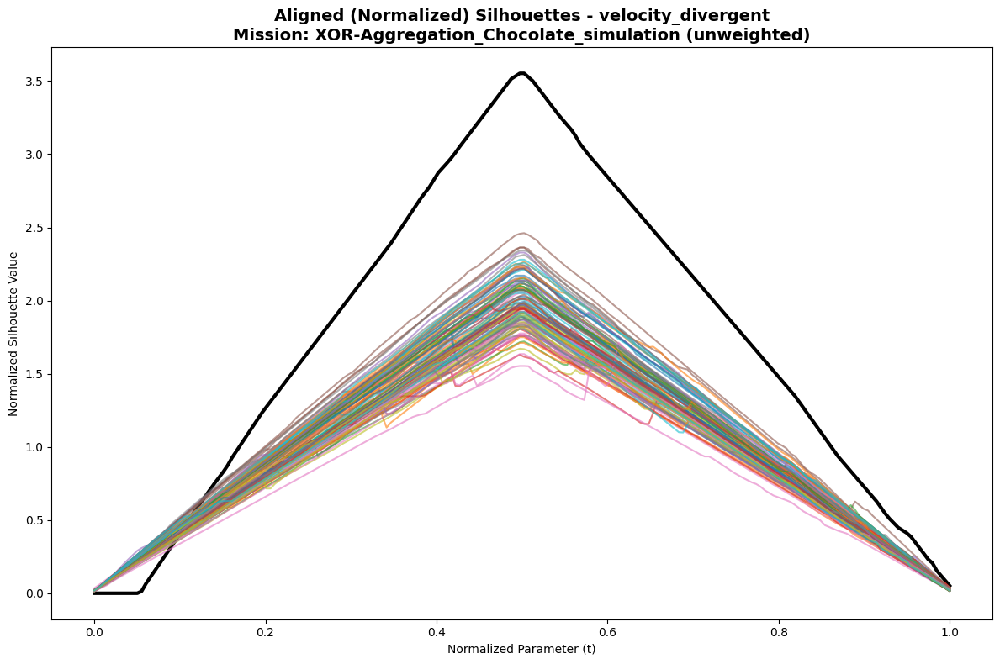

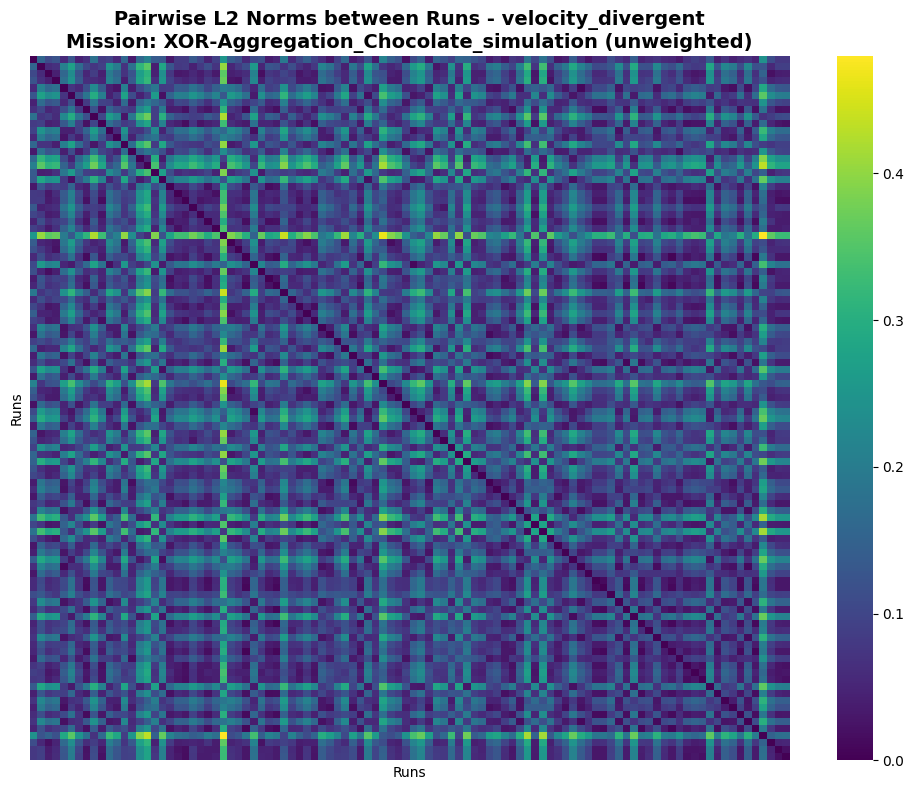

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


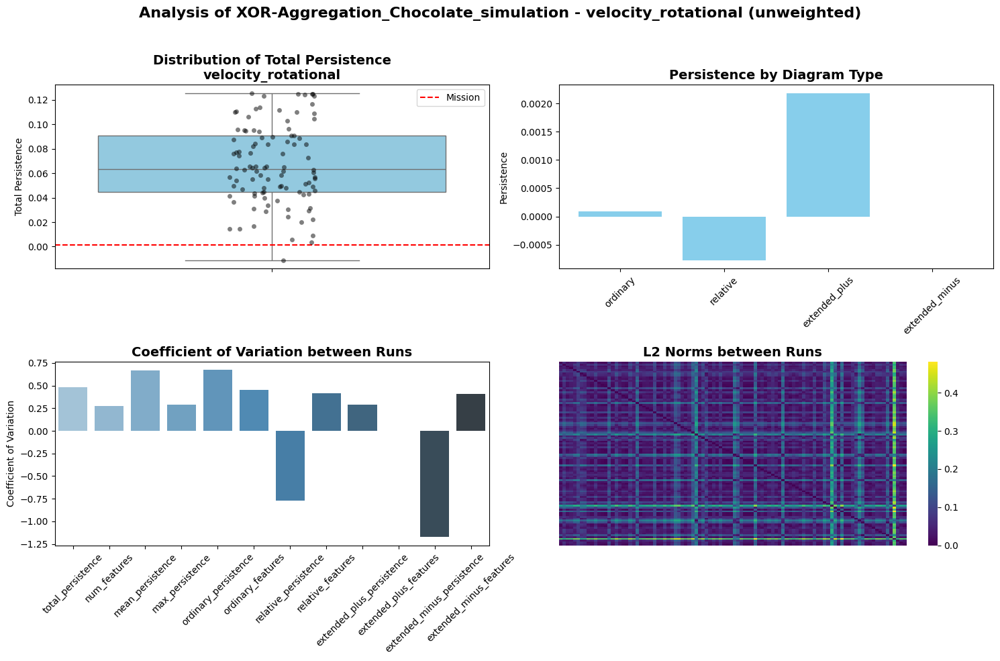

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


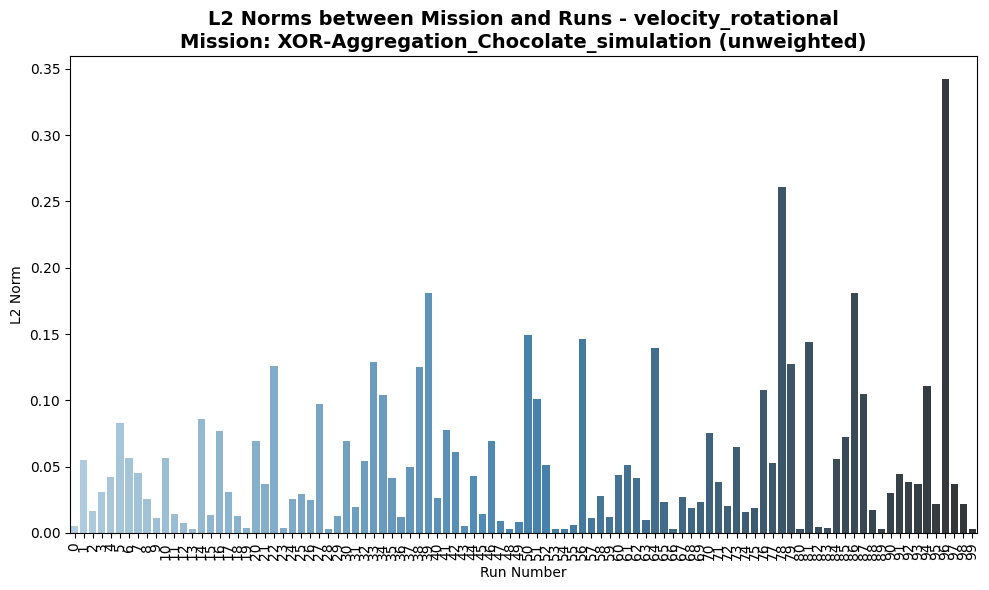

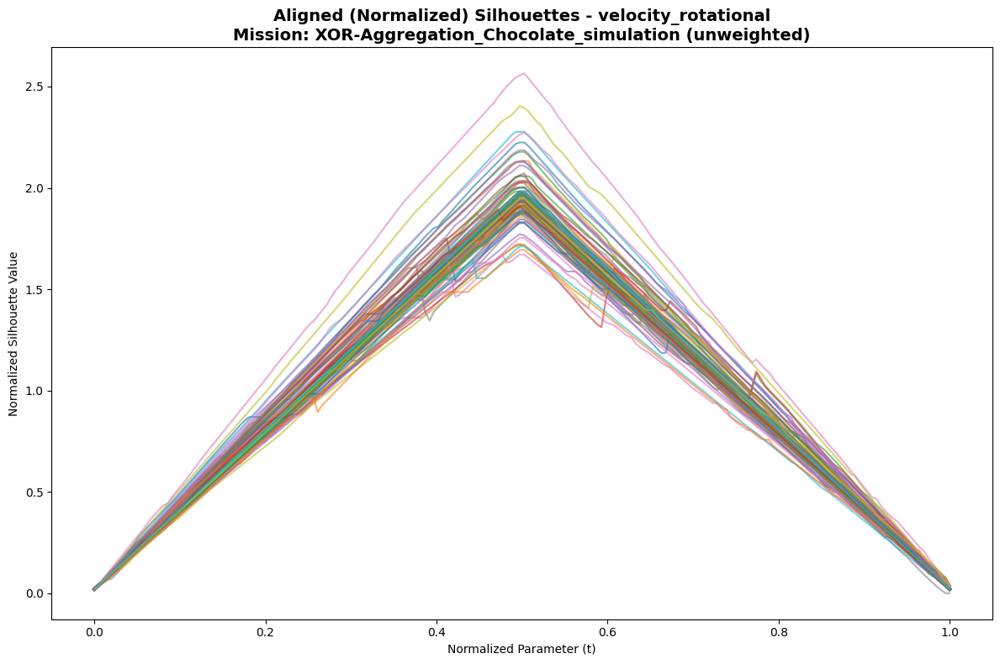

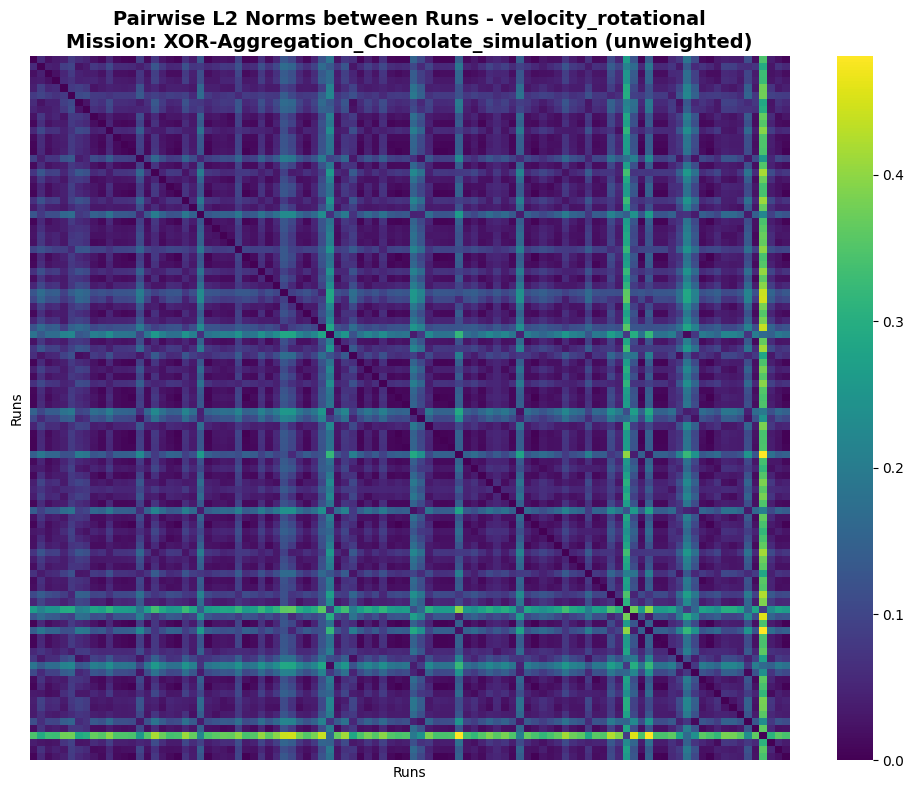

/tmp/ipykernel_69499/684757276.py:245: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 1].set_xticklabels(diagram_types, rotation=45)
/tmp/ipykernel_69499/684757276.py:250: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(cv_metrics.keys()), y=list(cv_metrics.values()), ax=axes[1, 0], palette='Blues_d')
/tmp/ipykernel_69499/684757276.py:252: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1, 0].set_xticklabels(list(cv_metrics.keys()), rotation=45)


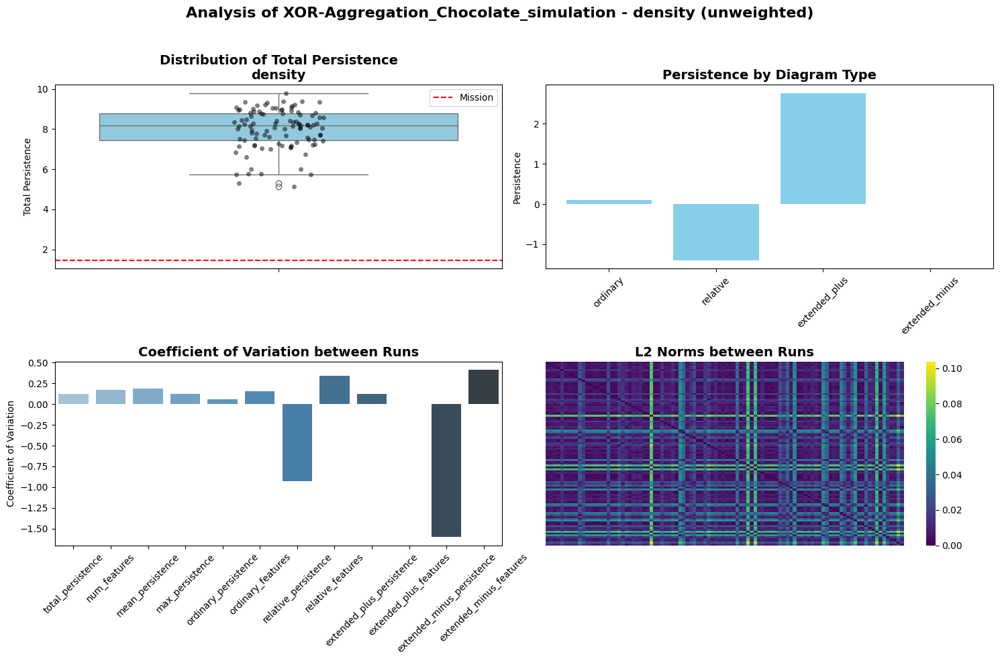

/tmp/ipykernel_69499/684757276.py:284: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=run_numbers, y=L2_norms, palette='Blues_d')


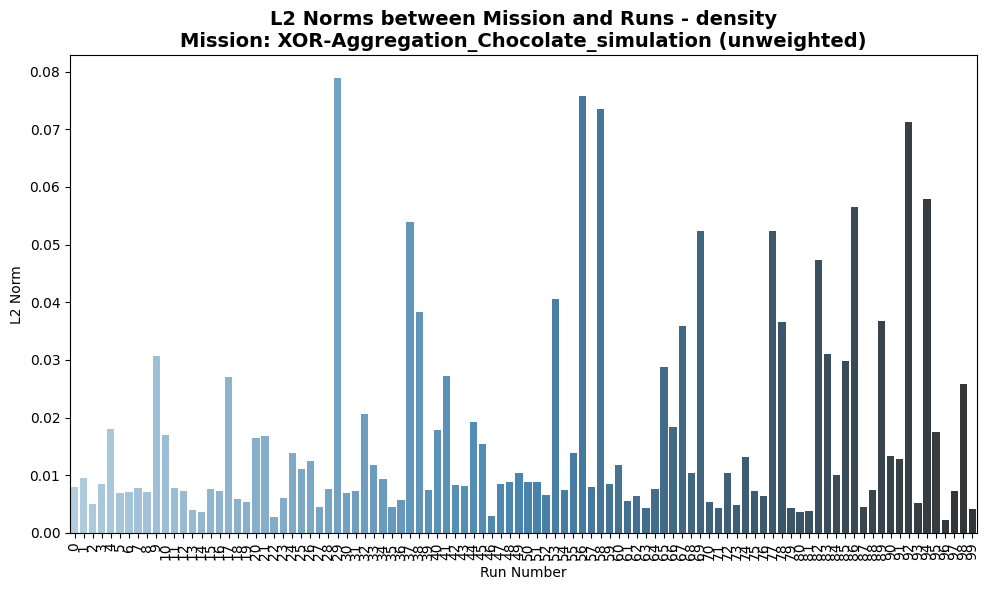

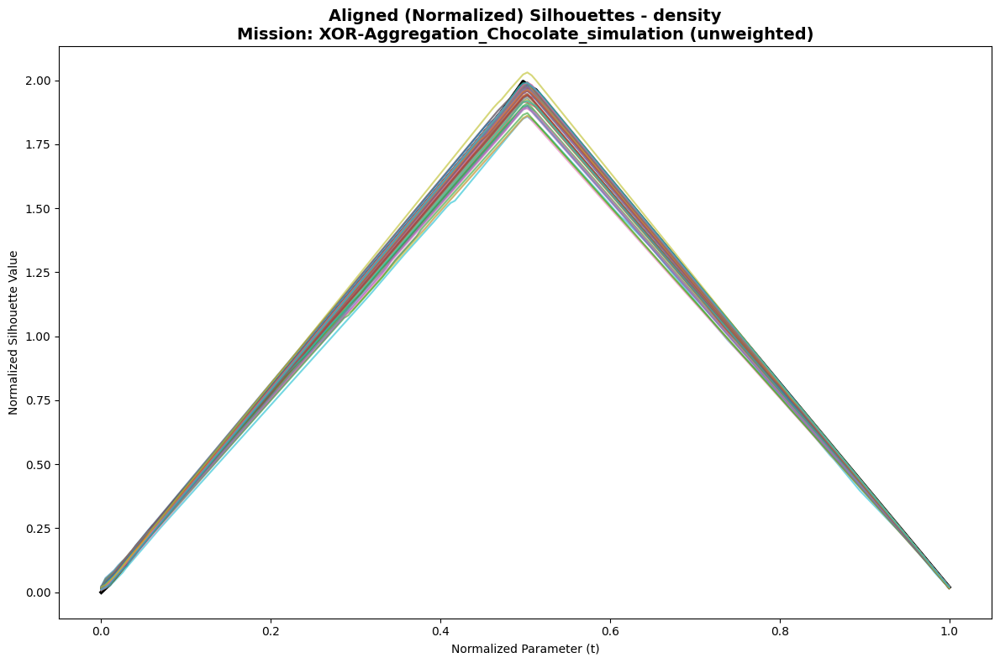

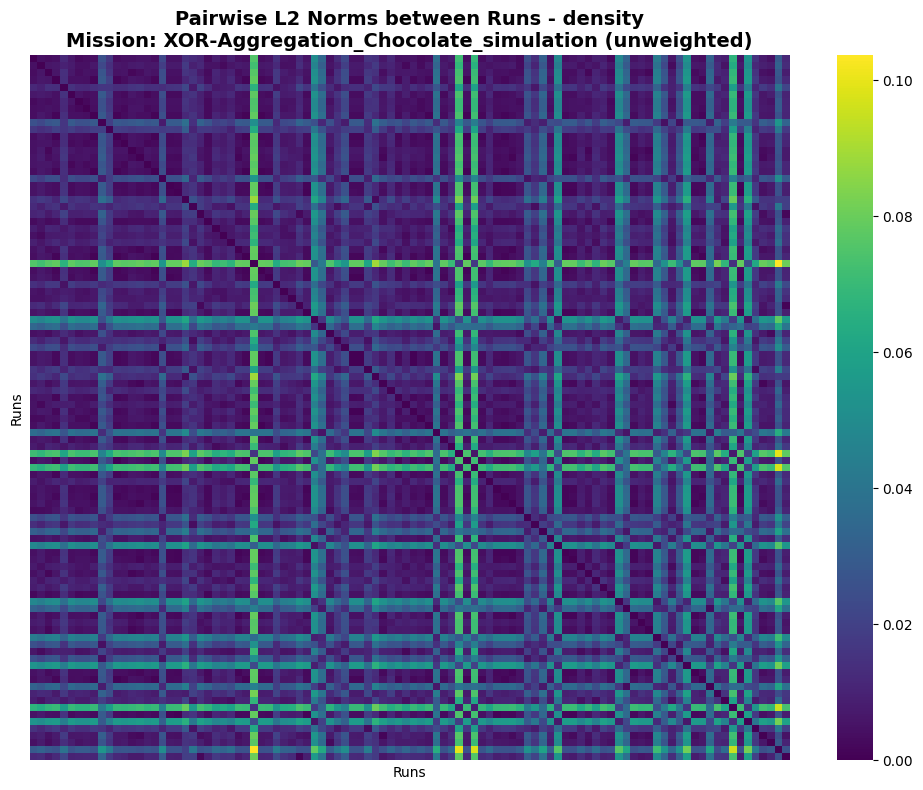

AttributeError: 'BehaviorAnalyzer' object has no attribute 'summarize_results'

In [17]:
if __name__ == "__main__":
    analyzer = analyze_all_missions()


In [13]:
class WeightedBehaviorAnalyzer(BehaviorAnalyzer):
    def __init__(self):
        super().__init__()
        self.metrics = {}
        self.field_types = ['velocity_divergent_weighted', 'velocity_rotational_weighted']  # Seulement les champs pondérés
        self.silhouette_resolution = 200

    def load_persistence_data(self, mission_name: str, data_type: str = 'missions') -> pd.DataFrame:
        """Surcharge pour charger les données pondérées."""
        filepath = Path(f"persistence/{data_type}/{mission_name}_weighted_persistence.csv")
        return pd.read_csv(filepath)

def analyze_all_weighted_missions():
    """Analyse toutes les missions avec les champs pondérés."""
    analyzer = WeightedBehaviorAnalyzer()
    missions_dir = Path('persistence/missions')
    for mission_file in sorted(missions_dir.glob('*_weighted_persistence.csv')):
        mission_name = mission_file.stem.replace('_weighted_persistence', '')
        print(f"\nAnalyse de {mission_name} (champs pondérés)")

        # Analyse complète de la mission
        analyzer.analyze_mission(mission_name)

        # Affiche les analyses par champ
        for field_type in analyzer.field_types:  # Utilise les champs pondérés
            analyzer.plot_field_analysis(mission_name, field_type)
            analyzer.plot_L2_norms(mission_name, field_type)
            analyzer.plot_silhouettes(mission_name, field_type)
            analyzer.plot_runs_coherence(mission_name, field_type)

    # Résume les résultats
    analyzer.summarize_results()

    # Trace les ICC
    analyzer.plot_icc()

    return analyzer

